In [7]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pandasql import sqldf
import matplotlib
import datetime
matplotlib.rcParams.update({'font.size': 22})
plt.rcParams['font.family']=['STFangsong']
starttime = datetime.datetime.now()
###########
#改變時間格式
###########
def Time_processing(d, t, ms):
    d = d.replace('/', '-')
    ds = d.split('-')
    d = ds[0] + '-' + ds[1].zfill(2) + '-' + ds[2].zfill(2)
    return d + ' ' + t + '.' + str(ms).zfill(3)

###########
#獨進所有的plc.csv檔，並將其concate在一起成為一個dataframe 傳回
###########
def Read_plc(plc_dir):
    csv_files = os.listdir(plc_dir)
    df = pd.DataFrame()
    df_list = []
    for c in csv_files:
        if c[-4:] == '.csv': 
            df_ = pd.read_csv(plc_dir + c, encoding='big5')
            df_['file'] = c
            df_list.append(df_)
    df = pd.concat(df_list)
    df['time'] = np.vectorize(Time_processing)(df['日期'],df['時間'],df['毫秒'])
    df.drop(['日期','時間','毫秒'],axis=1, inplace=True)
    df['實際進給'] = pd.to_numeric(df['實際進給'], errors='coerce').fillna(0)
    df['實際轉速'] = pd.to_numeric(df['實際轉速'], errors='coerce').fillna(0)
    df['設定進給'] = pd.to_numeric(df['設定進給'], errors='coerce').fillna(0)
    df['設定轉速'] = pd.to_numeric(df['設定轉速'], errors='coerce').fillna(0)
    df['Z軸機械座標'] = df.apply(lambda x: round(x['Z軸機械座標'],4), axis=1)
    print('Read_plc() finish!!!')
    print('time cost:', datetime.datetime.now()-starttime)
    return df


def Time_diff(x):
    t1 = datetime.datetime.strptime(x['time_begin'], '%Y-%m-%d %H:%M:%S.%f').timestamp() * 1000
    t2 = datetime.datetime.strptime(x['time_end'], '%Y-%m-%d %H:%M:%S.%f').timestamp() * 1000
    return t2 - t1
    
def Preprocess_df(plc_dir):
    plc_df = Read_plc(plc_dir)
    sql =("SELECT min(time) AS time_begin, max(time) AS time_end,"
                     "單節, 主軸負載, X軸機械座標, Y軸機械座標, Z軸機械座標,"
                     "實際進給, 實際轉速, 設定進給, 設定轉速, file, 進給率 "
                     "FROM plc_df "
                     "WHERE 單節 IS NOT NULL and 實際進給>0 and 實際轉速>0 "
                     " GROUP BY 單節, 主軸負載, X軸機械座標, Y軸機械座標, Z軸機械座標, "
                     "         實際進給, 實際轉速, file "
                     "ORDER BY time_begin, time_end")
    #設定進給==10000 and 設定轉速==2000 and 進給率==100 
    data = sqldf(sql, locals())
    data.reset_index(level=0, inplace=True)
    data['index0'] = data.index
    data['time_diff'] = data.apply(Time_diff,axis=1)

    return data


def Create_sgroup(data):
    zs = data['Z軸機械座標'].values
    sg = np.zeros(len(zs))#small group
    sg[0] = 1
    z_app = [zs[0]] # non-redundant z appears as time passes by
    z_ctr = [] # non-redundant z counter as time passes by
    c = 1
   
    for i in range(1, len(zs)):
        if zs[i] == zs[i-1]: 
            sg[i] = sg[i-1]
            c += 1
        else: 
            z_ctr.append(c)
            sg[i] = sg[i-1] + 1
            z_app.append(zs[i])
            c = 1
    z_ctr.append(c)
    return z_app, z_ctr

def Add_path(df):
    zs = df['z'].values
    c = 1
    path = []
    z_curr = zs[0]
    for z in zs:
        if z <= z_curr: 
            z_curr = z
            path.append(c)
        else:
            c += 1
            z_curr = z
            path.append(c)
    df['path'] = path
    return df

def Add_layer(df):
    dfs = []
    for l in df.path.unique():
        df1 = df[df.path==l]
        zs = df1['z'].values
        cs = df1['count'].values
        layer = np.zeros(len(df1))
        c = 1
        for curr in range(0, len(df1)-1):
            if layer[curr] == 0:
                layer[curr] = 1
            curr_z = zs[curr]
            curr_c = cs[curr]
            comp_z = zs[curr+1]
            comp_c = cs[curr+1]
            if round(comp_z-curr_z,3) == 0:
                layer[curr+1] = layer[curr]
                c += 1
            elif (round(comp_z-curr_z,3) == -0.6):# and (np.abs(comp_c-curr_c)<13) :
                layer[curr+1] = layer[curr] + 1
                c += 1
            elif comp_z-curr_z < -1.2:
                if c > 2:
                    break
                else:
                    layer[curr] = 0
                    curr += 1
                    
                    
                
        df1['layer'] = layer
        dfs.append(df1)
    df = pd.concat(dfs)
    return df

def Back_ori(aft_df, cha_df):
    cha_z = cha_df['z'].values
    cha_c = cha_df['count'].values
    cha_p = cha_df['path'].values
    cha_l = cha_df['layer'].values
    aft_z = []
    aft_p = []
    aft_l = []
    
    for i in range(len(cha_c)):
        aft_z += [cha_z[i]] * cha_c[i]
        aft_p += [cha_p[i]] * cha_c[i]
        aft_l += [cha_l[i]] * cha_c[i]
    aft_df['z_'] = aft_z
    aft_df['path'] = aft_p
    aft_df['layer'] = aft_l
    return aft_df

def Seg_df(data):
    print(data.columns)
    z_app, z_ctr = Create_sgroup(data)
    z_info = pd.DataFrame({'z':z_app, 'count':z_ctr})
    z_info['idx'] = z_info.index.values
    z1 = z_info[z_info['count']>10]

    z_idx = z1.index.values
    cols = ['idx', 'z', 'count']
    z1 = z1[cols]
    z2 = Add_path(z1)
    z3 = Add_layer(z2)
    cols = ['idx', 'z', 'count', 'path', 'layer']
    z4 = z3[cols]
    z4 = Modi_layer(z4)
    z5 = z_info.merge(z4, left_on='idx', right_on='idx', how='outer')
    cols = ['idx', 'z_x', 'count_x', 'path', 'layer']
    z6 = z5[cols]
    z6.columns = ['idx', 'z', 'count', 'path', 'layer']
    z7 = Back_ori(data, z6) 
    cols = ['index', 'time_begin', 'time_end', '單節', '主軸負載', 
           'Z軸機械座標', '實際進給', '實際轉速', '設定進給', '設定轉速', 'index0', 'z_',
           'path', 'layer', '進給率']
    #print(z7.columns)
    z8 = z7[cols]
    endtime = datetime.datetime.now()
    print('Seg_df() finish!!! time cost:', endtime-starttime)
    
    return z8

def Get_draws(z8):
    draws = []
    path = z8.path.nunique()
    
    for p in range(1,path+1):
        z9 = z8[z8.path==p]
        d = []
        layer_sz = z9.layer.nunique()
        if z9.layer.nunique()>2:
            d.append((p, 2))
            d.append((p, int(layer_sz/2)))
            d.append((p, layer_sz-1))
            draws.append(d)
    return draws

def Get_part(z8, p, l):
    sql = "SELECT * FROM z8 WHERE path==" + str(p)
    sql += " and layer==" + str(l) 
    sql += " ORDER BY index0"
    z9 = sqldf(sql, locals())
    return z9

def Draw_basic(z8, data):
    plt.figure(figsize=(15,9))
    plt.plot(data['X軸機械座標'],data['Y軸機械座標'], c='y')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.title('XY加工路徑')
    plt.show()

    plt.figure(figsize=(15,9))
    plt.subplot(711)
    plt.plot(z8['index0'],z8['Z軸機械座標'], c='y')
    plt.ylabel('Z')


    plt.subplot(712)
    plt.plot(z8['index0'],z8['主軸負載'], c='y')
    plt.ylabel('loading')

    plt.subplot(713)
    colors = ['C0', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9']
    
    for i in range(1,z8.path.nunique()+1):
        p = i
        if p >= 1:
            plt.plot(z8[z8['path']==p]['index0'],z8[z8['path']==p]['主軸負載'], c=colors[i-1], label=str(p))
    plt.ylabel('loading')
    
    plt.subplot(714)
    plt.plot(z8['index0'],z8['實際轉速'], c='y')
    plt.ylabel('實際轉速')
    
    plt.subplot(715)
    plt.plot(z8['index0'],z8['實際進給'], c='y')
    plt.ylabel('實際進給')

    plt.subplot(716)
    plt.plot(z8['index0'],z8['設定轉速'], c='y')
    plt.ylabel('設定轉速')

    
    plt.legend(loc='best') 
    plt.xlabel('time')
    plt.show()
    
    
    
    
    
def Draw_diff(z8, draws):
    for dr in draws:
        plt.figure(figsize=(15,9))
        sub = [311, 312, 313]
        clist = ['y', 'g', 'b']
        for i,d in enumerate(dr):
            p, l = d[0], d[1]
            part_z = Get_part(z8, p, l)
            plt.subplot(sub[i])
            leg = 'path:'+str(p)+', layer:'+str(l)
            print(leg, len(part_z))
            plt.plot(part_z['index0'],part_z['主軸負載'], c=clist[i], label=leg)
            plt.legend(loc='best') 
            plt.ylabel('loading')
        plt.xlabel('time')
        plt.show()

#將同一path中，中間有斷掉或是shift的seq再接起來，例如前五個都是差-0.6，後五個也是差-0.6，但是中間shift掉0.2，此function可以把這兩個
#seq再接起來
def Modi_layer(z4):
    #先找出同一path中，相鄰的row的layer difference，這是為了要知道每個seq 的長度
    idx_diff = {}
    for p in z4['path'].unique():
        p_df = z4[z4['path']==p]
        ls = p_df['layer'].values
        idx = p_df['idx'].values
        idx_diff[idx[0]] = 0
        for i in range(1, len(ls)):
            idx_diff[idx[i]] = ls[i] - ls[i-1]
    
    diff = []
    for i in z4.idx.values:
        diff.append(idx_diff[i])
    z4['diff_layer'] = diff
    m_ht = {}
    
    #若是同一path中，有至少兩條seq，則找出第二條seq的起始的idx，再加上第一條seq len，重新更改其layer
    for p in z4['path'].unique():
        lens = []
        p_df = z4[z4['path']==p]
        ds = p_df.diff_layer.values
        for d in ds:
            if d < -1:
                lens.append(np.abs(d))
        
            
        if len(lens) > 1:
            l_df = p_df[p_df['layer']==2]
            
            #找出第二條seq的起始的idx，
            idx_arr = []
            curr_z = -99999
            for i in range(len(l_df)):
                idx = l_df.iloc[i].idx
                z = l_df.iloc[i].z
                if z != curr_z:
                    idx_arr.append(idx)
                    curr_z = z
            
            
            #將其改成(起始的idx, 要增加的長度）
            m_arr = []
            for i in range(len(idx_arr)-1):
                len_sum = 0
                for j in range(i+1):
                    len_sum += lens[i]
                m_arr.append((idx_arr[i+1], len_sum))
            
            #在m_arr改layer, 若是該row的layer_diff>=0就可以改，表示是屬同一seq
            #將他有改的部分存在m_ht中，記錄其[idx]=new_layer
            for m in m_arr:
                m_i = m[0]
                m_len = m[1]
                m_tag = 0
                for i in range(len(p_df)):
                    if p_df.iloc[i].idx >= m_i and p_df.iloc[i].diff_layer >= 0:
                        m_ht[p_df.iloc[i].idx] = p_df.iloc[i].layer + m_len
                        m_tag = 1
                    else:
                        if m_tag == 0:
                            continue
                        else:
                            break
    
    #最後根據m_ht中的idx, new_layer來改z4中的layer
    idx_arr = z4.idx.values
    layer_arr = z4.layer.values
    for i in range(len(idx_arr)):
        idx = idx_arr[i]
        if idx in m_ht:
            layer_arr[i] = m_ht[idx]        
    return z4


In [8]:
def Deal_plc(plc_dir):
    data = Preprocess_df(plc_dir)
    z8 = Seg_df(data)

    Draw_basic(z8, data)
    draws = Get_draws(z8)
    Draw_diff(z8, draws)
    return z8

In [9]:
def Calc_stat(z8):
    path = z8.path.nunique()
    paths = []
    layers = []
    counts = []
    means = []
    stds = []
    rms2 = []
    maxs = []
    
    for p in range(1,path+1):
        z9 = z8[z8.path==p]
        d = []
        layer_sz = z9.layer.nunique()
        if layer_sz > 2:
            for l in range(2, layer_sz):
                z10 = z9[z9.layer==l]
                loads = z10['主軸負載'].values
                #print(p, l, len(z10), round(np.mean(loads),1), round(np.std(loads),1))
                paths.append(p)
                layers.append(l)
                counts.append(len(z10))
                means.append(round(np.mean(loads),1))
                stds.append(round(np.std(loads),1))
                rms2.append(np.sqrt(np.sum(np.power(loads,2)/len(loads))))
                maxs.append(np.max(loads))
    return pd.DataFrame({'path':paths, 'layer':layers, 'count':counts, 'mean':means, 'std': stds, 'rms2':rms2, 'max':maxs})
    

In [10]:
def Dras_stat(z15):
    stat_df = Calc_stat(z15)
    colors = ['C0', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9']
    plt.figure(figsize=(15,9))
    for i in range(1, stat_df.path.nunique()+1):
        t_df = stat_df[stat_df.path==i]
        c = colors[i-1]
        plt.plot(t_df.index, t_df['mean'].values, c=c, label=str(i))
    plt.xlabel('#data points')
    plt.ylabel('loading')
    plt.legend(loc='best') 
    plt.title('mean_loading in different paths')
    plt.show()

    plt.figure(figsize=(15,9))
    for i in range(1, stat_df.path.nunique()+1):
        t_df = stat_df[stat_df.path==i]
        c = colors[i-1]
        plt.plot(t_df.index, t_df['std'].values, c=c, label=str(i))
    plt.xlabel('#data points')
    plt.ylabel('loading')
    plt.legend(loc='best') 
    plt.title('std_loading in different paths')
    plt.show()

    plt.figure(figsize=(15,9))
    for i in range(1, stat_df.path.nunique()+1):
        t_df = stat_df[stat_df.path==i]
        c = colors[i-1]
        plt.plot(t_df.index, t_df['rms2'].values, c=c, label=str(i))
    plt.xlabel('#data points')
    plt.ylabel('loading')
    plt.legend(loc='best') 
    plt.title('rms_loading in different paths')
    plt.show()
    
    plt.figure(figsize=(15,9))
    for i in range(1, stat_df.path.nunique()+1):
        t_df = stat_df[stat_df.path==i]
        c = colors[i-1]
        plt.plot(t_df.index, t_df['max'].values, c=c, label=str(i))
    plt.xlabel('#data points')
    plt.ylabel('loading')
    plt.legend(loc='best') 
    plt.title('max_loading in different paths')
    plt.show()

/Users/Zion/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:2: DtypeWarning: Columns (12) have mixed types. Specify dtype option on import or set low_memory=False.
  from ipykernel import kernelapp as app


Read_plc() finish!!!
time cost: 0:00:17.115327
Index(['index', 'time_begin', 'time_end', '單節', '主軸負載', 'X軸機械座標', 'Y軸機械座標',
       'Z軸機械座標', '實際進給', '實際轉速', '設定進給', '設定轉速', 'file', '進給率', 'index0',
       'time_diff'],
      dtype='object')


/Users/Zion/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:135: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


Seg_df() finish!!! time cost: 0:00:35.576632


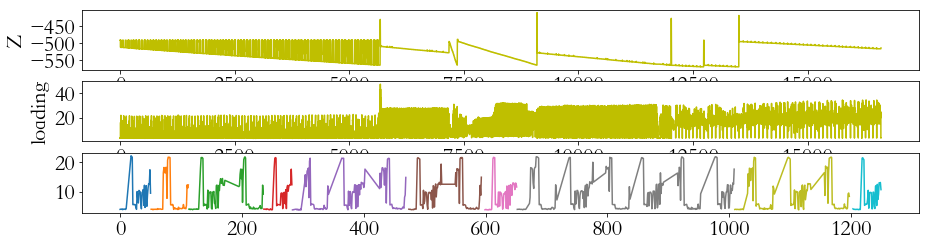

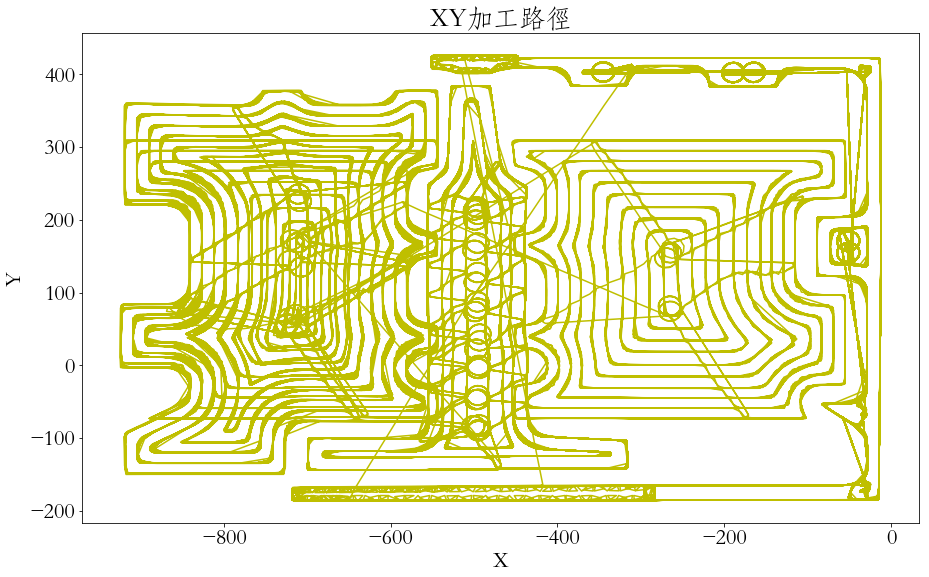

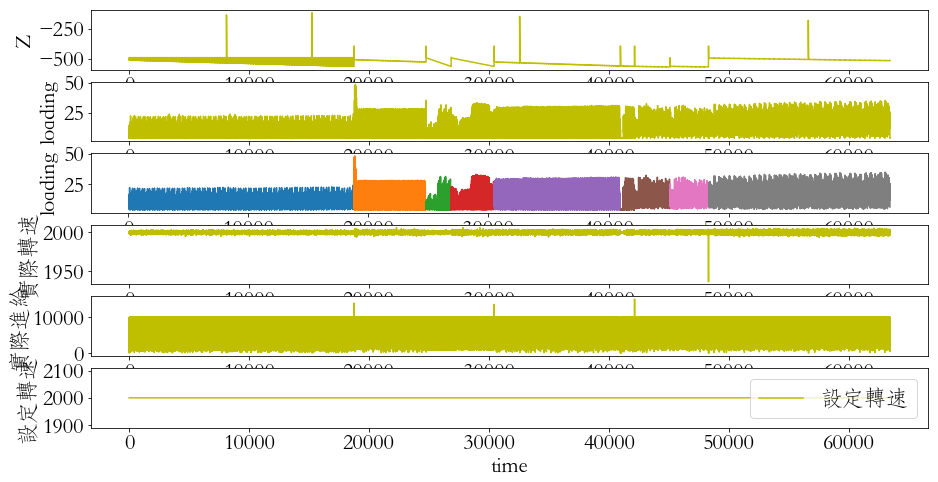

path:1, layer:2 112
path:1, layer:41 111
path:1, layer:82 110


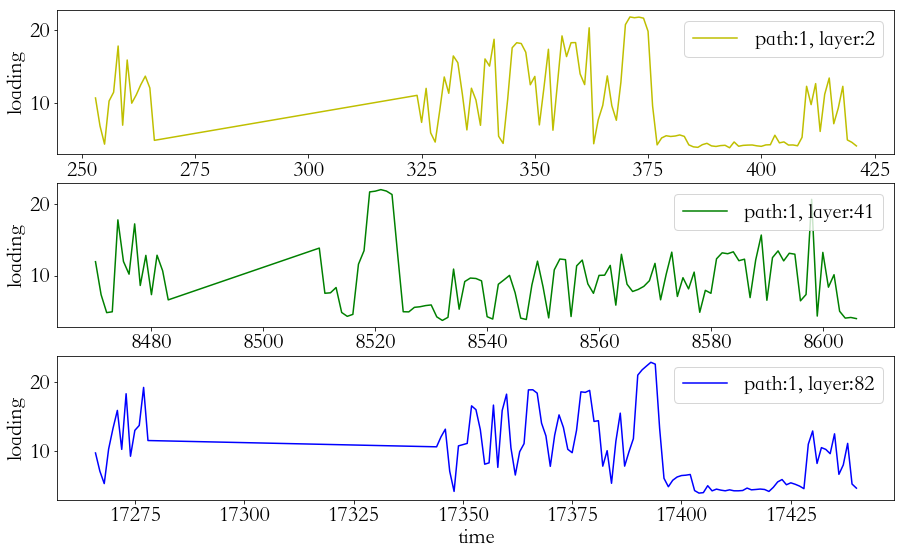

path:2, layer:2 174
path:2, layer:16 174
path:2, layer:31 173


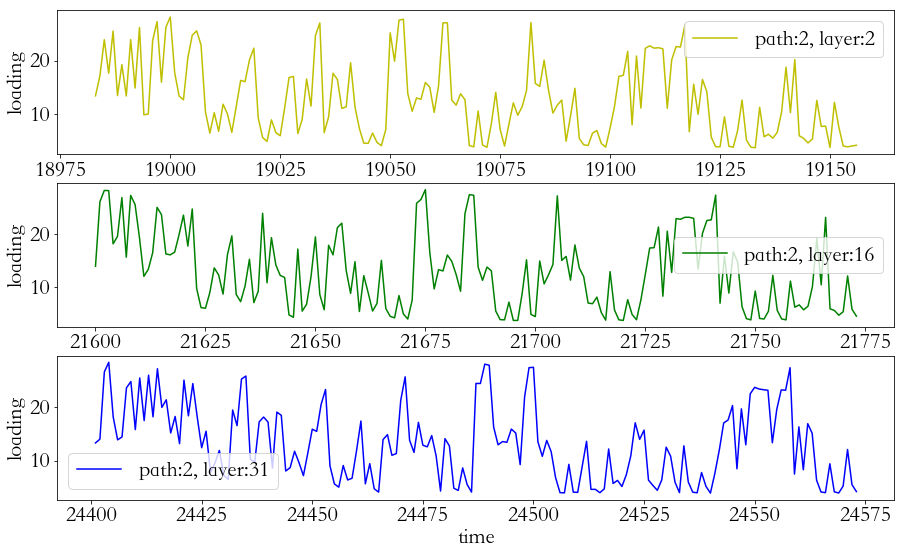

path:3, layer:2 14
path:3, layer:56 16
path:3, layer:112 15


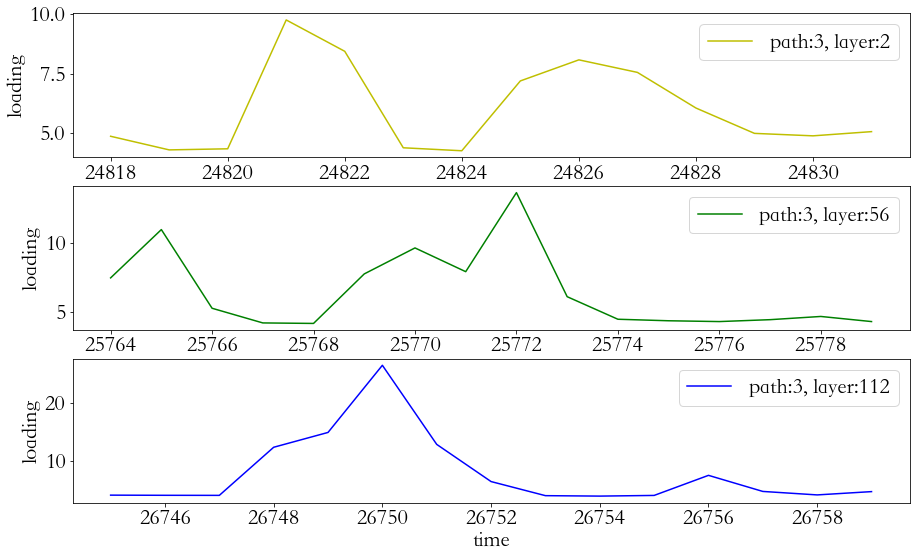

path:4, layer:2 28
path:4, layer:56 28
path:4, layer:112 28


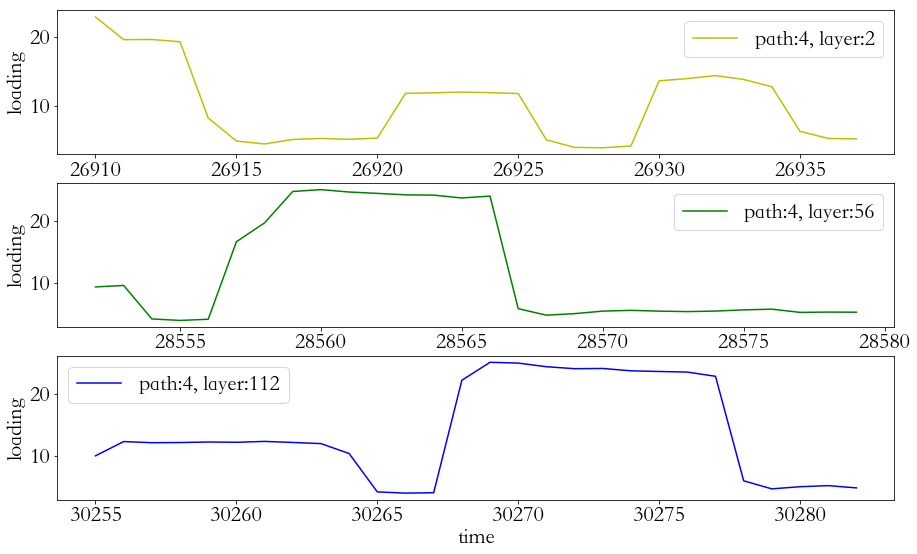

path:5, layer:2 174
path:5, layer:28 174
path:5, layer:55 173


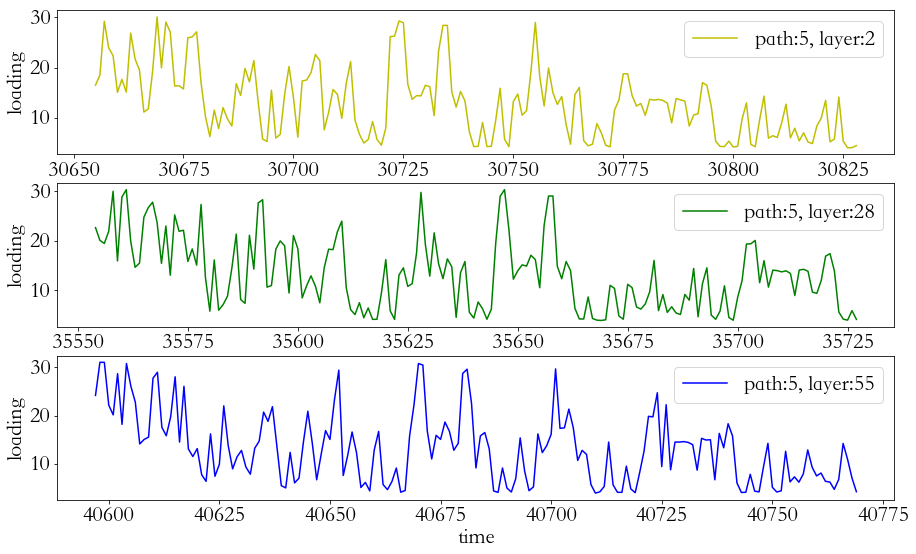

path:6, layer:2 312
path:6, layer:3 312
path:6, layer:5 312


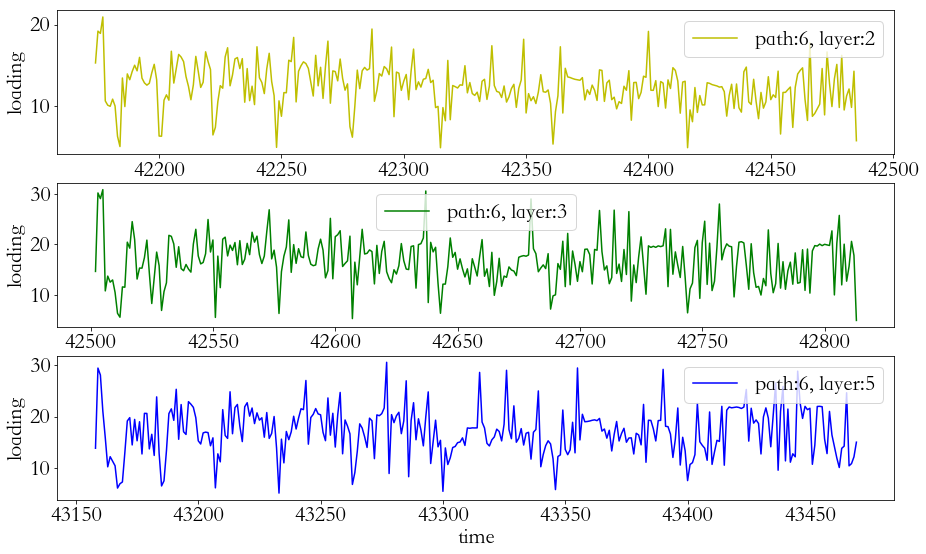

path:7, layer:2 339
path:7, layer:2 339
path:7, layer:4 336


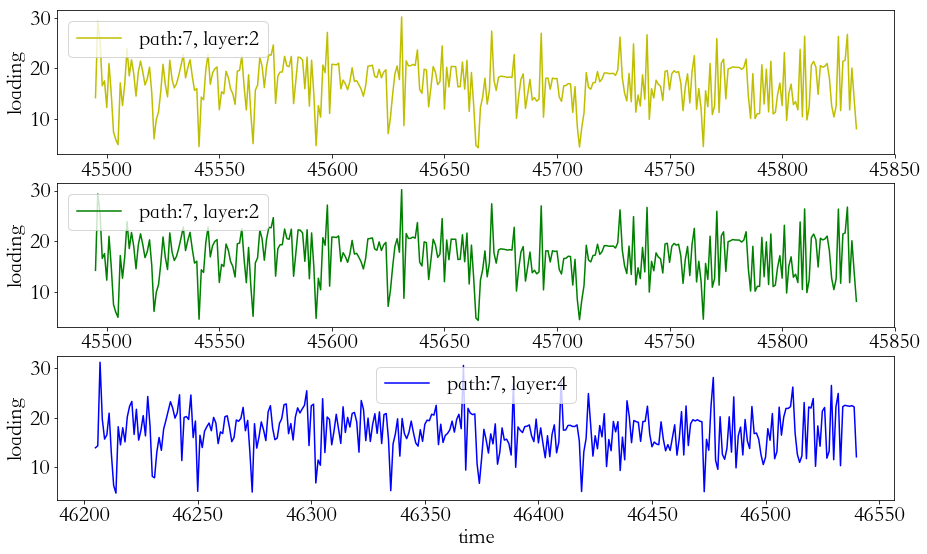

path:8, layer:2 412
path:8, layer:18 405
path:8, layer:35 399


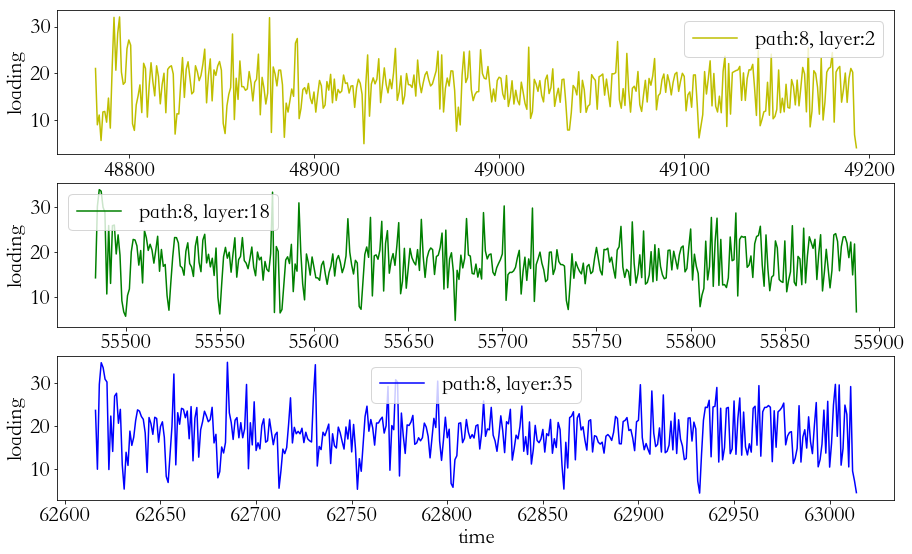

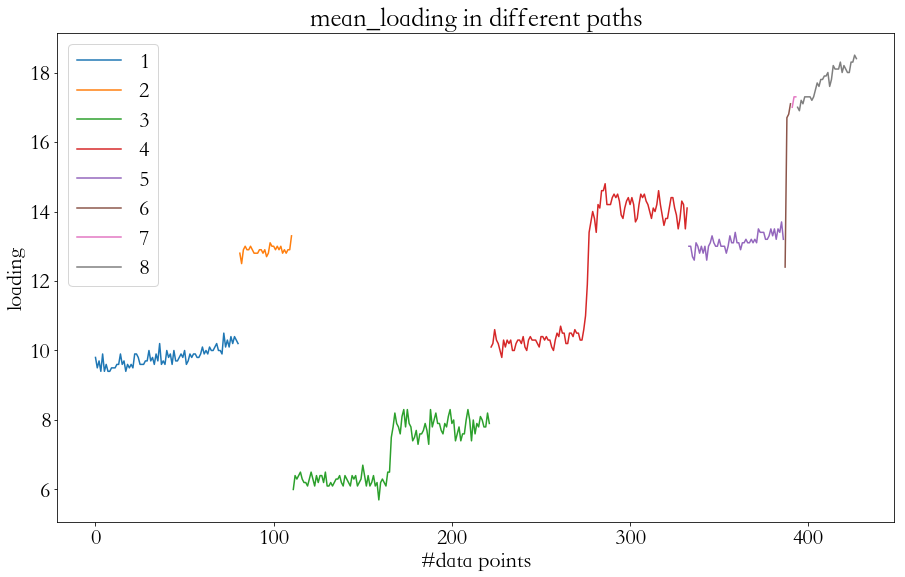

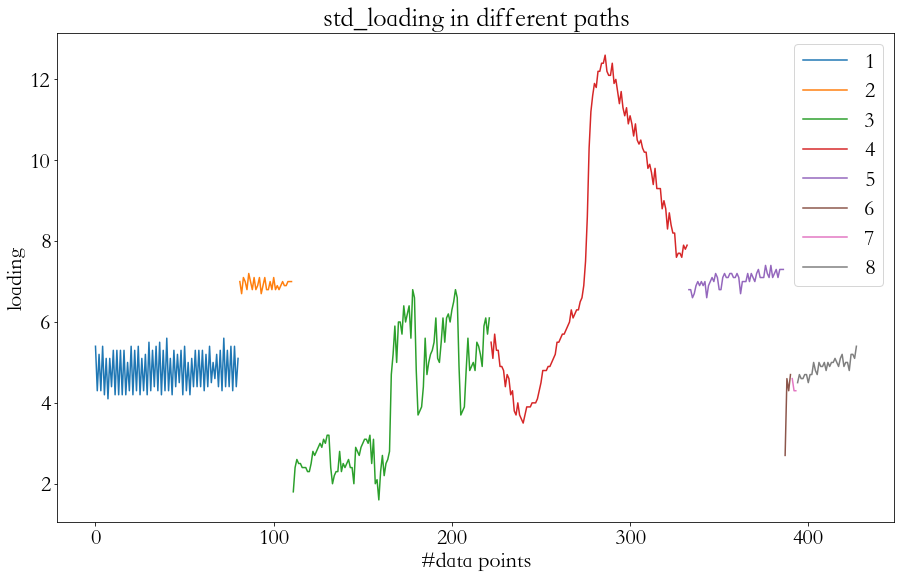

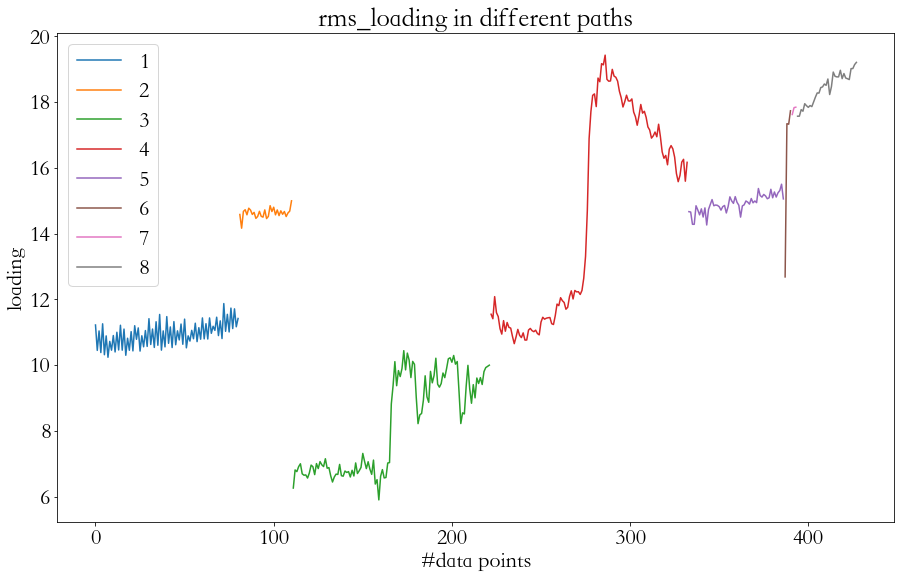

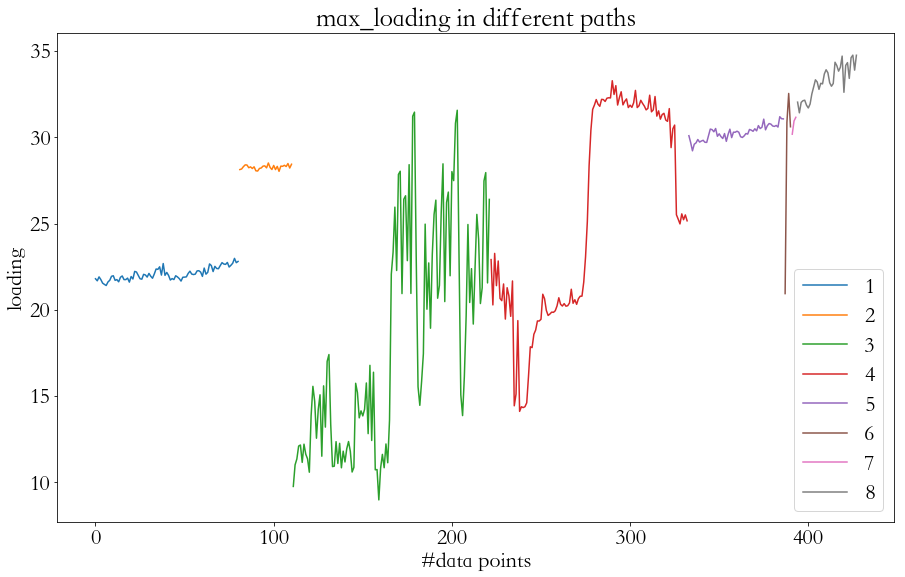

In [11]:
plc_dir = '/Users/Zion/Downloads/15-PLC/'
z15 = Deal_plc(plc_dir)
Dras_stat(z15)

In [12]:
z15

,index,time_begin,time_end,單節,主軸負載,Z軸機械座標,實際進給,實際轉速,設定進給,設定轉速,index0,z_,path,layer,進給率
0,0,2018-07-06 14:10:32.611,2018-07-06 14:10:32.721,X133.473Y281.321,4.065065,-509.1750,199.999996,1999.912262,10000.0,2000,0,-509.1750,NaN,NaN,1.000000
1,1,2018-07-06 14:10:32.861,2018-07-06 14:10:32.951,X133.473Y281.321,3.967406,-509.1750,573.644137,2000.427246,10000.0,2000,1,-509.1750,NaN,NaN,6.000000
2,2,2018-07-06 14:10:33.111,2018-07-06 14:10:33.211,X133.473Y281.321,4.028443,-509.1750,1000.000015,2000.484467,10000.0,2000,2,-509.1750,NaN,NaN,10.000000
3,3,2018-07-06 14:10:33.351,2018-07-06 14:10:33.431,X133.473Y281.321,3.942991,-509.1750,1000.000015,2000.484467,10000.0,2000,3,-509.1750,NaN,NaN,10.000000
4,4,2018-07-06 14:10:33.611,2018-07-06 14:10:33.721,X133.473Y281.321,4.062014,-509.1750,1000.000015,1999.225616,10000.0,2000,4,-509.1750,NaN,NaN,10.000000
5,5,2018-07-06 14:10:33.871,2018-07-06 14:10:33.951,X133.473Y281.321,3.894162,-509.1750,1000.000015,2000.484467,10000.0,2000,5,-509.1750,NaN,NaN,10.000000
6,6,2018-07-06 14:10:34.111,2018-07-06 14:10:34.221,X133.473Y281.321,3.982665,-509.1750,1000.000015,2000.484467,10000.0,2000,6,-509.1750,NaN,NaN,10.000000
7,7,2018-07-06 14:10:34.351,2018-07-06 14:10:34.421,X133.473Y281.321,3.997925,-509.1750,1000.000015,1999.626160,10000.0,2000,7,-509.1750,NaN,NaN,10.000000
8,8,2018-07-06 14:10:34.601,2018-07-06 14:10:34.721,X133.473Y281.321,3.912473,-509.1750,1000.000015,1999.454498,10000.0,2000,8,-509.1750,NaN,NaN,10.000000
9,9,2018-07-06 14:10:34.881,2018-07-06 14:10:34.991,X133.473Y281.321,4.098636,-509.1750,3057.600119,1999.683380,10000.0,2000,9,-509.1750,NaN,NaN,30.000002


/Users/Zion/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:2: DtypeWarning: Columns (12) have mixed types. Specify dtype option on import or set low_memory=False.
  from ipykernel import kernelapp as app
/Users/Zion/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:2: DtypeWarning: Columns (12,14) have mixed types. Specify dtype option on import or set low_memory=False.
  from ipykernel import kernelapp as app
/Users/Zion/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:2: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  from ipykernel import kernelapp as app


Read_plc() finish!!!
time cost: 0:00:18.127566
Index(['index', 'time_begin', 'time_end', '單節', '主軸負載', 'X軸機械座標', 'Y軸機械座標',
       'Z軸機械座標', '實際進給', '實際轉速', '設定進給', '設定轉速', 'file', '進給率', 'index0',
       'time_diff'],
      dtype='object')


/Users/Zion/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:135: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


Seg_df() finish!!! time cost: 0:00:31.436717


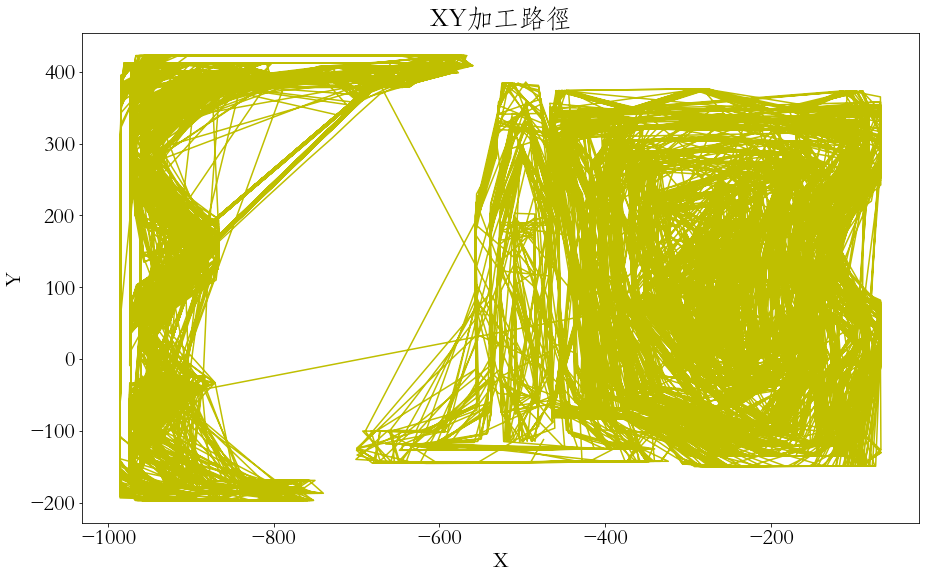

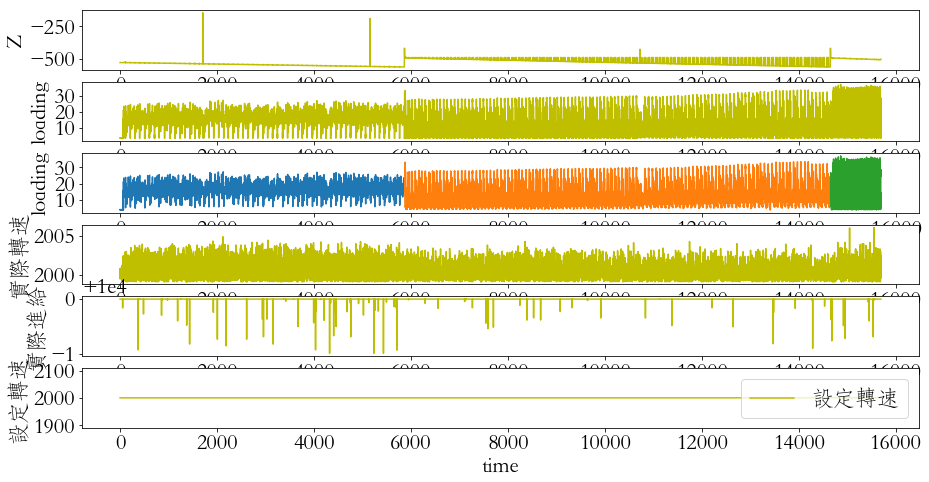

path:1, layer:2 97
path:1, layer:27 100
path:1, layer:53 94


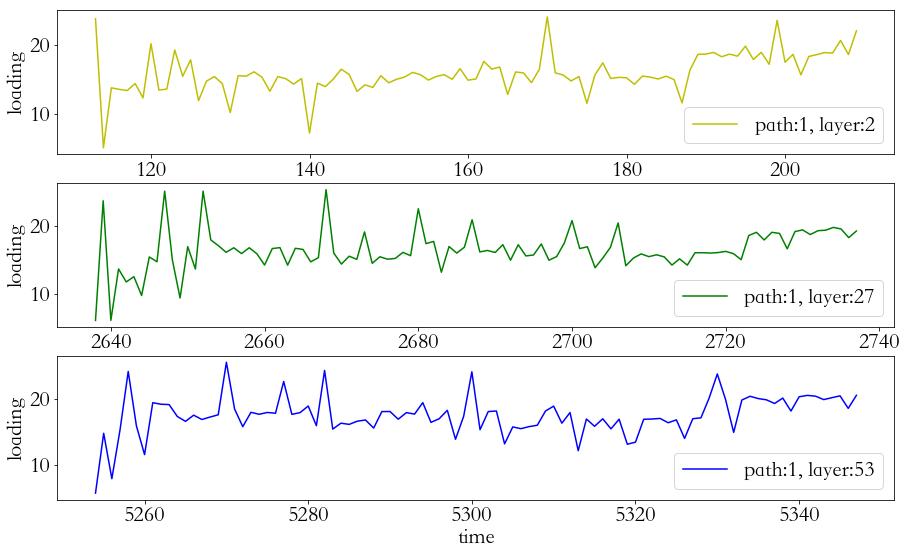

path:2, layer:2 60
path:2, layer:55 52
path:2, layer:110 51


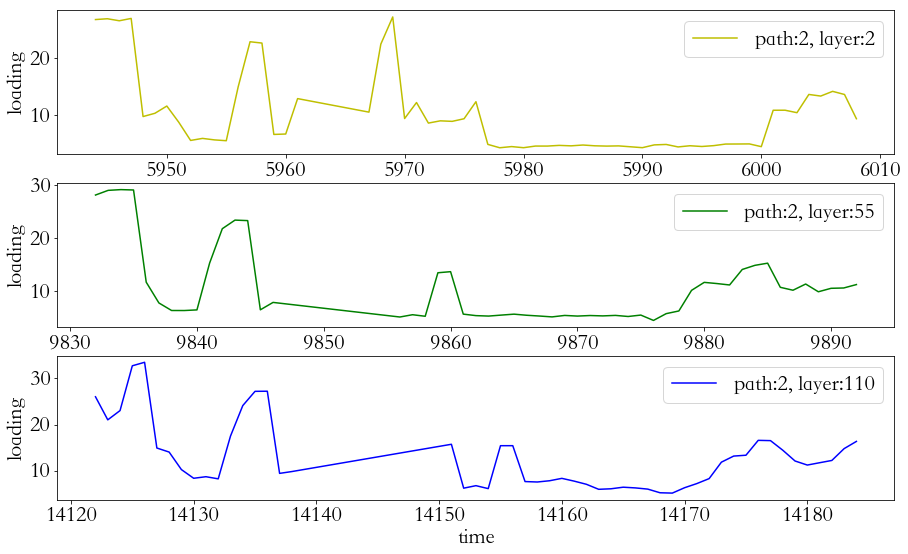

path:3, layer:2 38
path:3, layer:11 47
path:3, layer:22 45


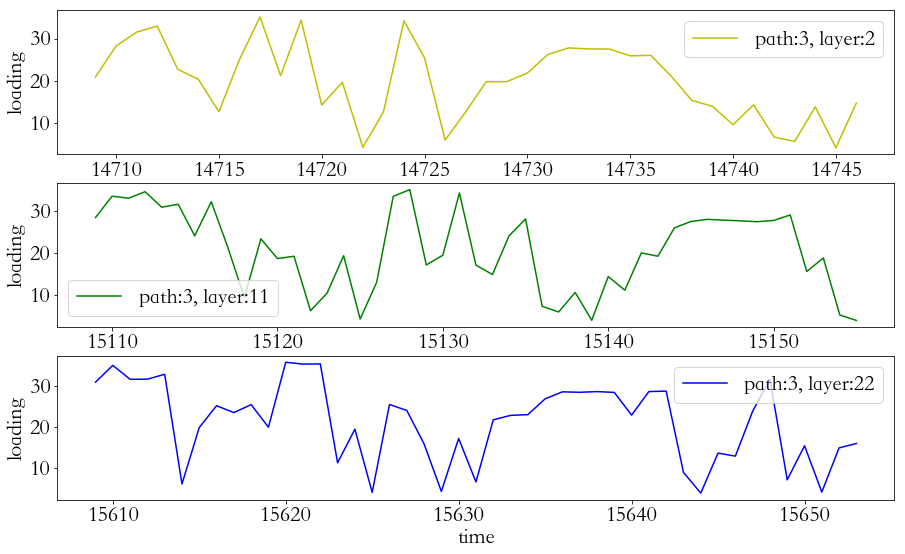

NameError: name 'Check_AC' is not defined

In [137]:
plc_dir = '/Users/Zion/Downloads/14-PLC/'
z14 = Deal_plc(plc_dir)
Check_AC(z14)

In [13]:
df = Preprocess_df('/Users/Zion/Downloads/15-PLC/')

/Users/Zion/anaconda/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2881: DtypeWarning: Columns (12) have mixed types. Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


Read_plc() finish!!!
time cost: 0:03:23.863196


In [140]:
df.to_csv('/Users/Zion/Desktop/ori_15.csv')

In [14]:
prog = df['單節'].values
load = df['主軸負載'].values
dtime = df['time_diff'].values

In [15]:
base = prog[0]
load_sum = load[0]
dtime_sum = dtime[0]
g_prog = []
g_load = []
g_dtime = []
g_load_avg = []
g_load_max = []
g_load_std = []
t_load = [load[0]]

for i in range(1, len(prog)):
    comp = prog[i]
    if base == comp:
        load_sum += load[i]
        dtime_sum += dtime[i]
        t_load.append(load[i])
    else:
        g_prog.append(base)
        g_load.append(load_sum)
        g_dtime.append(dtime_sum)
        g_load_max.append(np.max(t_load))
        g_load_std.append(np.std(t_load))
        #print(i , base, load_sum, dtime_sum)
        g_load_avg.append(load_sum/dtime_sum)
        base = comp
        load_sum = load[i]
        dtime_sum = dtime[i]
        t_load = [load[i]]
        
g_prog.append(comp)
g_load.append(load_sum)
g_dtime.append(dtime_sum)
g_load_avg.append(load_sum/dtime_sum)
g_load_max.append(np.max(t_load))
g_load_std.append(np.std(t_load))

g_df = pd.DataFrame({'prog':g_prog, 'load_sum':g_load, 'dtime_sum':g_dtime, 'avg_load':g_load_avg, 'max_load':g_load_max, 'std_load':g_load_std})
print(g_df.head(100))

/Users/Zion/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:25: RuntimeWarning: divide by zero encountered in double_scalars


                                          prog   load_sum  dtime_sum  \
0                             X133.473Y281.321  44.041260     1060.0   
1                           G1X160.286Z-18.000  31.962036      400.0   
2               G3X162.913Y283.396I0.000J2.700  12.451552       90.0   
3              G3X160.286Y286.722I-2.627J0.626   7.336650       90.0   
4                                     X143.588   7.727287      110.0   
5                                     X126.891  14.752647       80.0   
6                                   G1X160.286  11.291849      200.0   
7                                   G1X153.949   3.903317       90.0   
8                                     G1Z3.200   7.596057      170.0   
9                             X291.603Y285.655  11.749626      300.0   
10                                    Z-15.087   3.836177       70.0   
11                    X291.410Y283.642Z-17.400   3.961303      130.0   
12    G3X304.873Y269.562Z-17.550I13.772J-0.309  17.212439      2

In [16]:
m_load = g_df['avg_load'].values
diff_load = [0]
for i in range(1, len(m_load)):
    diff_load.append(m_load[i]-m_load[i-1])
g_df['diff_load'] = np.abs(diff_load)
g_df.to_csv('/Users/Zion/Desktop/g_df.csv')


In [20]:
g_df.columns

Index(['prog', 'load_sum', 'dtime_sum', 'avg_load', 'max_load', 'std_load',
       'diff_load'],
      dtype='object')

In [26]:
g_df1 = g_df[['load_sum', 'dtime_sum', 'avg_load', 'max_load', 'std_load', 'diff_load']]
g_df1.describe()

,load_sum,dtime_sum,avg_load,max_load,std_load,diff_load
count,41879.000000,41879.000000,4.187900e+04,41879.000000,41879.000000,4.187900e+04
mean,19.048262,135.310227,inf,13.065330,0.529963,inf
std,18.091317,109.084398,NaN,6.701722,1.322840,NaN
min,3.555406,0.000000,1.261104e-02,3.555406,0.000000,0.000000e+00
25%,8.224738,80.000000,7.897972e-02,7.144383,0.000000,2.112096e-02
50%,14.575640,100.000000,1.364008e-01,12.845241,0.000000,5.214850e-02
75%,21.706290,160.000000,2.014061e-01,17.529832,0.068334,1.034900e-01
max,229.456465,2960.000000,inf,48.646504,17.490158,inf


In [22]:
from sklearn.mixture import BayesianGaussianMixture
bgmm = BayesianGaussianMixture(n_components=10).fit(g_df1)
    

ValueError: Input contains NaN, infinity or a value too large for dtype('float64').

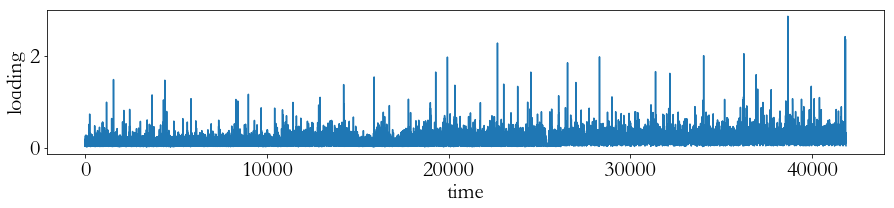

In [132]:

plt.figure(figsize=(15,9))
plt.subplot(3,1,1)
y1 = g_df['avg_load'].values
plt.plot(y1)
plt.xlabel('time')
plt.ylabel('loading')
plt.show()

/Users/Zion/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:15: RuntimeWarning: divide by zero encountered in true_divide


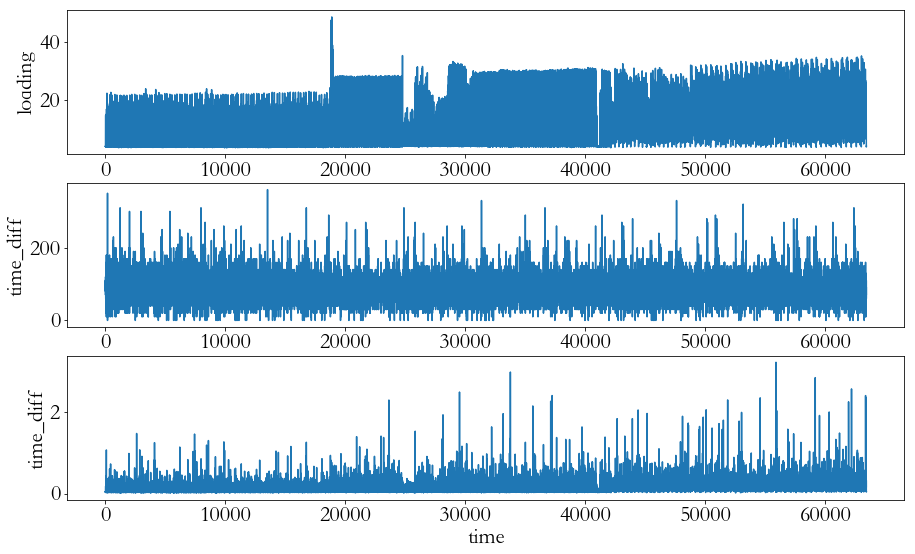

In [83]:
plt.figure(figsize=(15,9))
plt.subplot(3,1,1)
y1 = df['主軸負載'].values
plt.plot(y1)
plt.xlabel('time')
plt.ylabel('loading')

plt.subplot(3,1,2)
y2 = df['time_diff'].values
plt.plot(y2)
plt.xlabel('time')
plt.ylabel('time_diff')

plt.subplot(3,1,3)
y3 = y1/y2
plt.plot(y3)
plt.xlabel('time')
plt.ylabel('time_diff')

plt.show()

Index(['index', 'time_begin', 'time_end', '單節', '主軸負載', 'X軸機械座標', 'Y軸機械座標',
       'Z軸機械座標', '實際進給', '實際轉速', '設定進給', '設定轉速', 'file', '進給率', 'index0'],
      dtype='object')


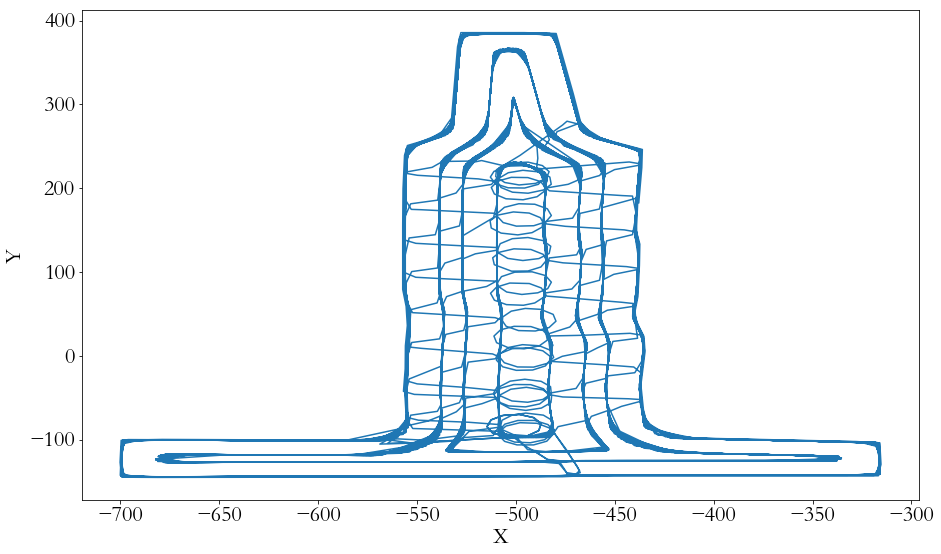

In [28]:

print(df.columns)
x = df.iloc[53500:]['X軸機械座標'].values
y = df.iloc[53500:]['Y軸機械座標'].values
plt.figure(figsize=(15,9))
plt.plot(x, y)
plt.xlabel('X')
plt.ylabel('Y')
plt.show()


/Users/Zion/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:2: DtypeWarning: Columns (12) have mixed types. Specify dtype option on import or set low_memory=False.
  from ipykernel import kernelapp as app
/Users/Zion/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:2: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  from ipykernel import kernelapp as app
/Users/Zion/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:2: DtypeWarning: Columns (5,13) have mixed types. Specify dtype option on import or set low_memory=False.
  from ipykernel import kernelapp as app


Read_plc() finish!!!
time cost: 11:12:09.735100


/Users/Zion/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:129: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


Seg_df() finish!!! time cost: 11:12:38.159301


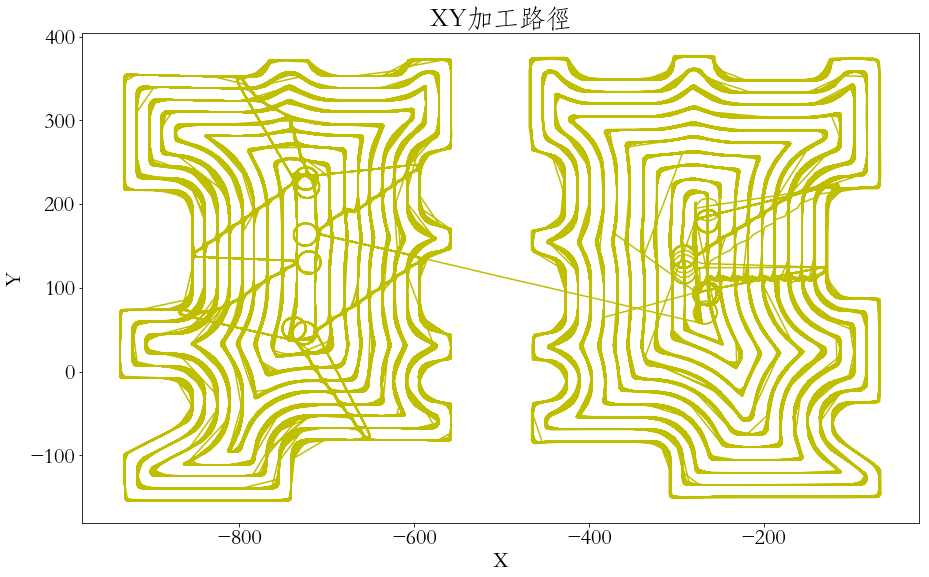

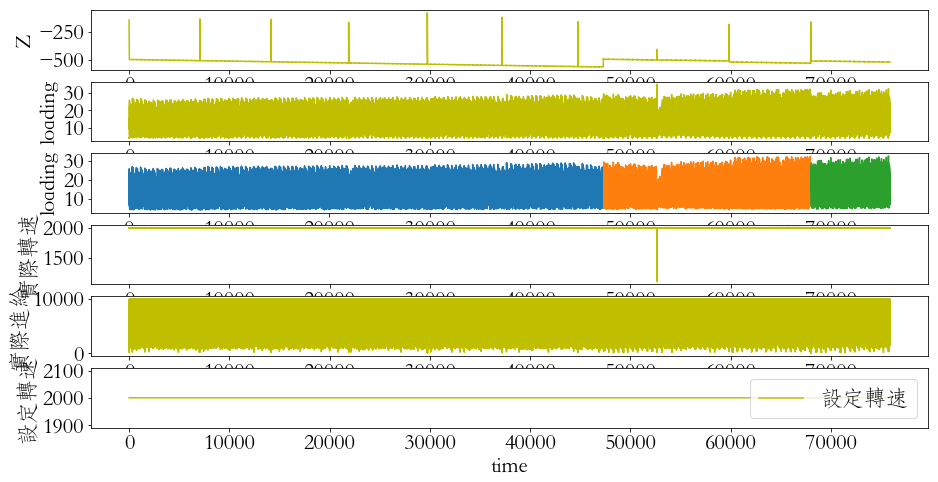

path:1, layer:2 401
path:1, layer:54 402
path:1, layer:108 402


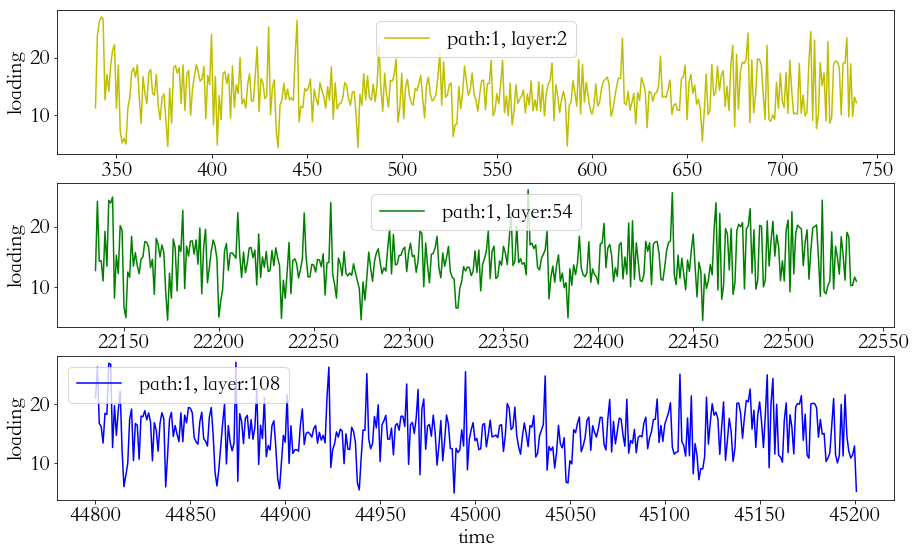

path:2, layer:2 450
path:2, layer:13 446
path:2, layer:26 448


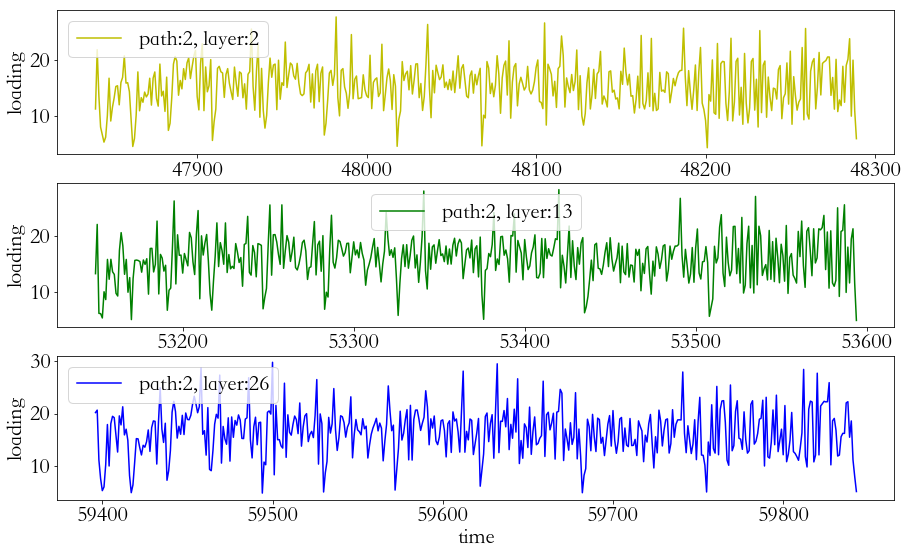

path:3, layer:2 445
path:3, layer:8 445
path:3, layer:16 447


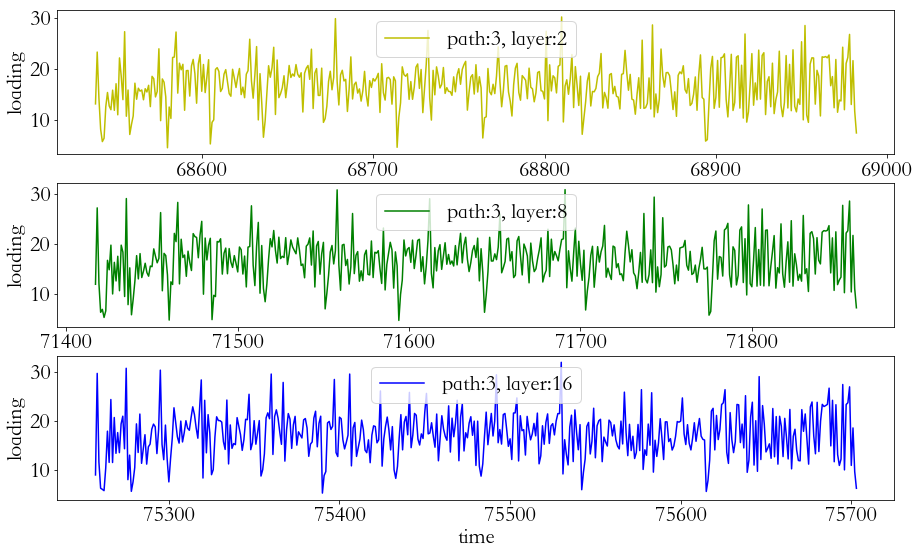

In [230]:
plc_dir = '/Users/Zion/Downloads/13-PLC/'
z13 = Deal_plc(plc_dir)


/Users/Zion/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:2: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  from ipykernel import kernelapp as app


Read_plc() finish!!!
time cost: 11:13:17.053105
Seg_df() finish!!! time cost: 11:13:34.097994


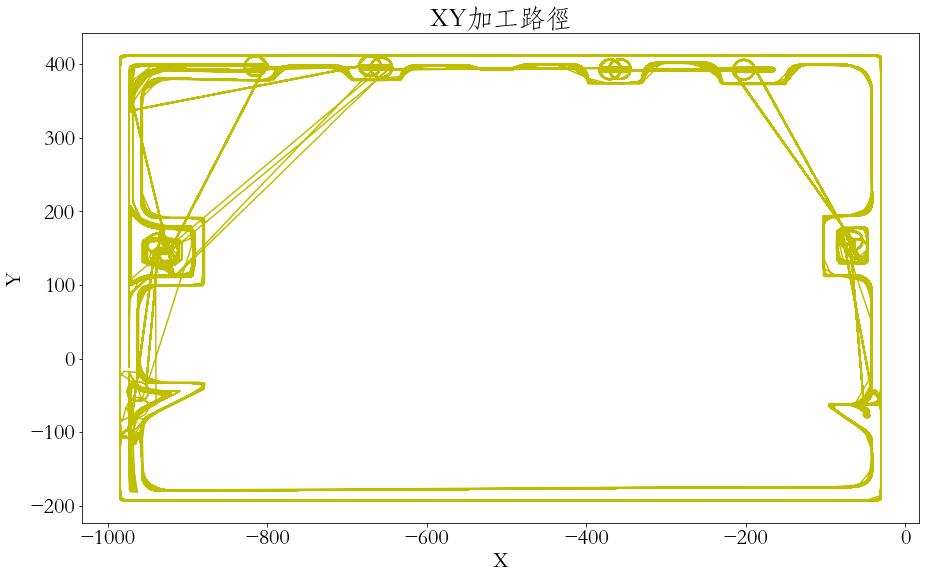

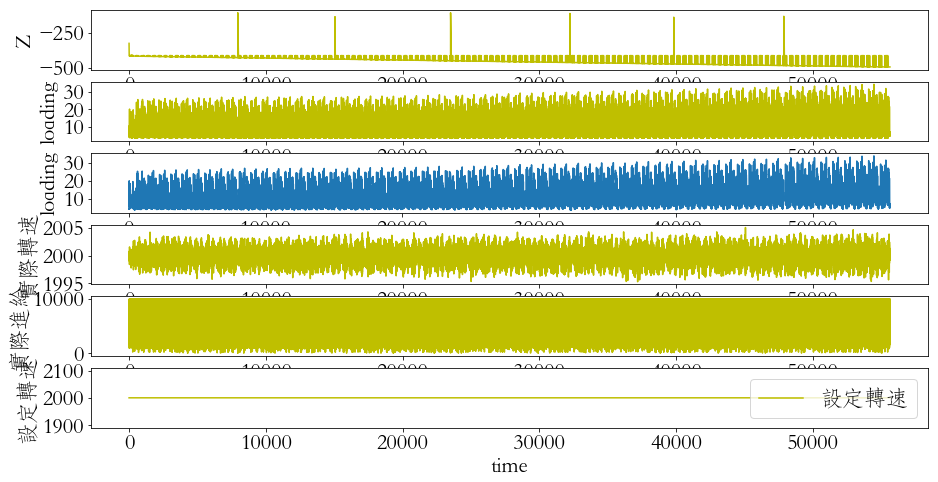

path:1, layer:2 286
path:1, layer:64 263
path:1, layer:128 260


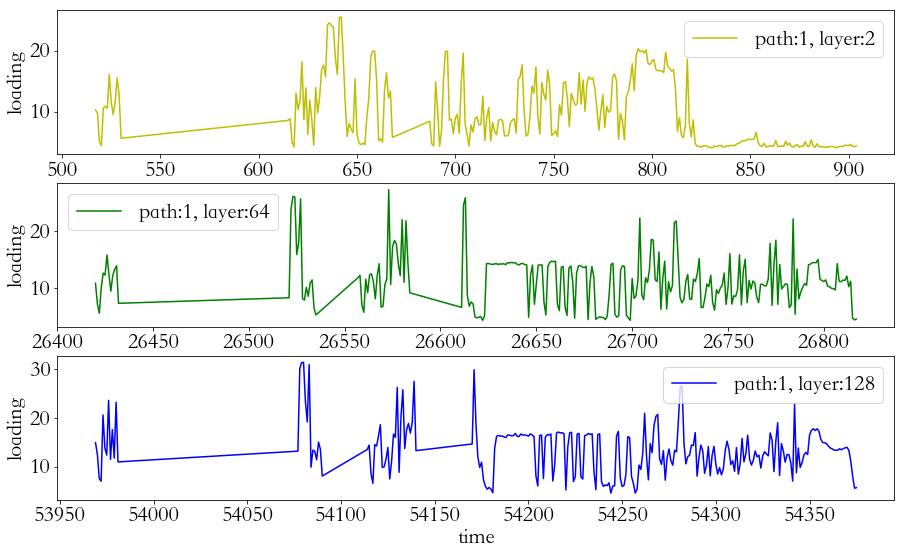

In [231]:
plc_dir = '/Users/Zion/Downloads/12-PLC/'
z12 = Deal_plc(plc_dir)



/Users/Zion/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:2: DtypeWarning: Columns (12) have mixed types. Specify dtype option on import or set low_memory=False.
  from ipykernel import kernelapp as app


Read_plc() finish!!!
time cost: 11:14:00.958720


/Users/Zion/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:129: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


Seg_df() finish!!! time cost: 11:14:19.729893


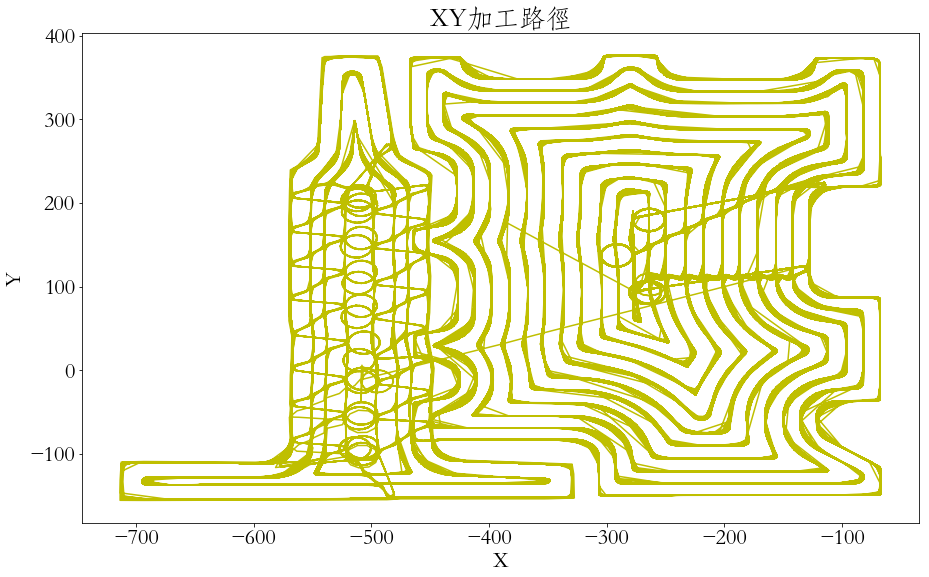

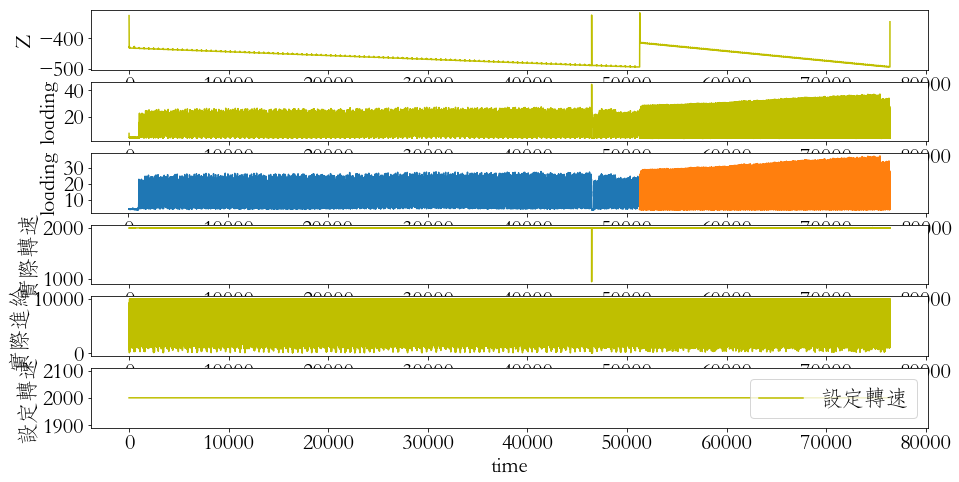

path:1, layer:2 446
path:1, layer:51 448
path:1, layer:101 445


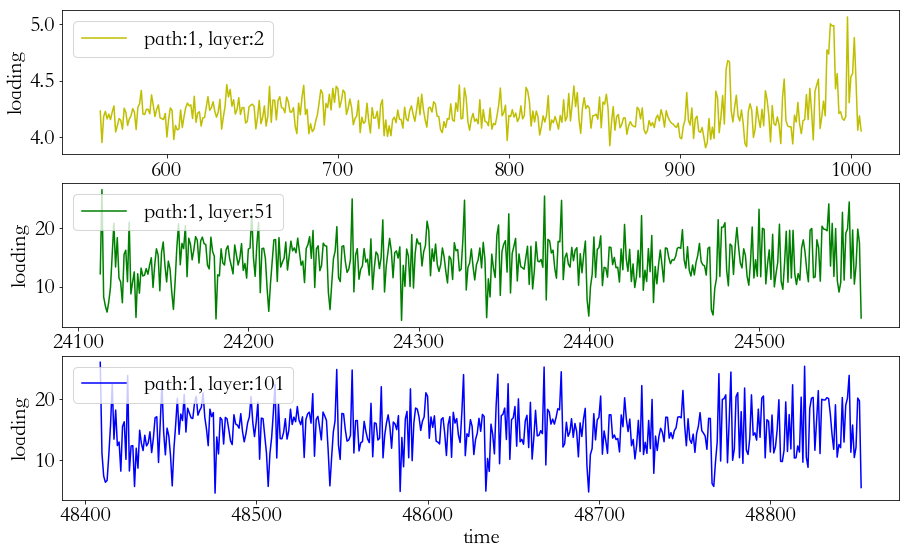

path:2, layer:2 175
path:2, layer:65 174
path:2, layer:129 175


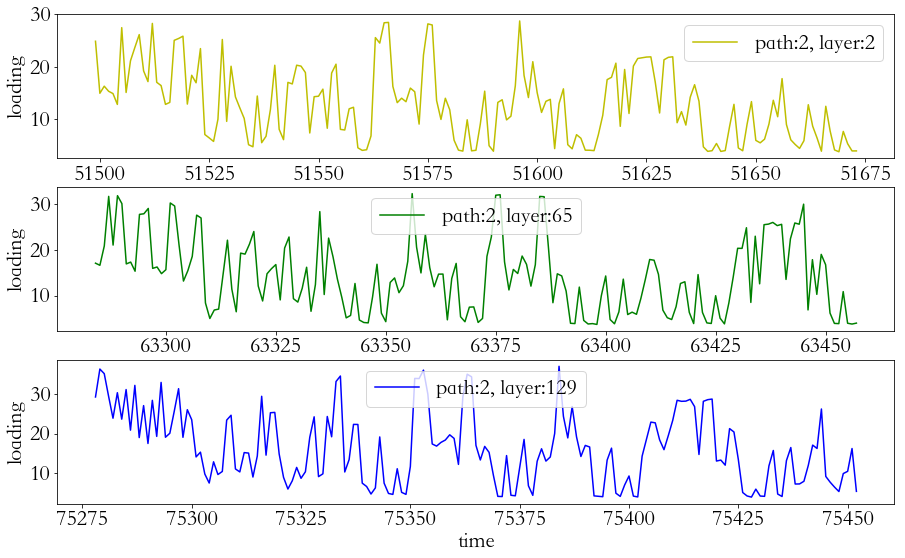

In [232]:
plc_dir = '/Users/Zion/Downloads/11-PLC/'
z11= Deal_plc(plc_dir)



/Users/Zion/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:2: DtypeWarning: Columns (12) have mixed types. Specify dtype option on import or set low_memory=False.
  from ipykernel import kernelapp as app


Read_plc() finish!!!
time cost: 11:14:48.507386


/Users/Zion/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:129: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


Seg_df() finish!!! time cost: 11:15:06.977347


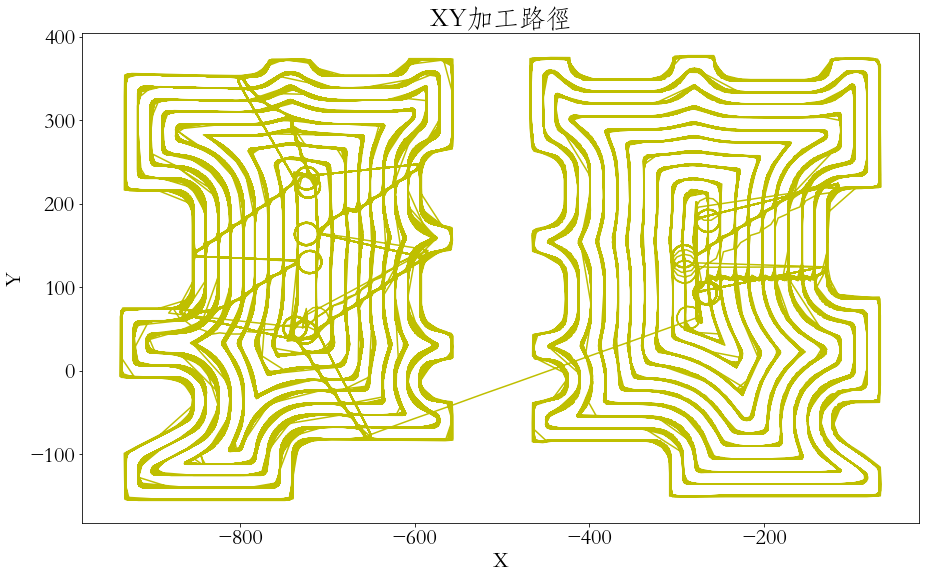

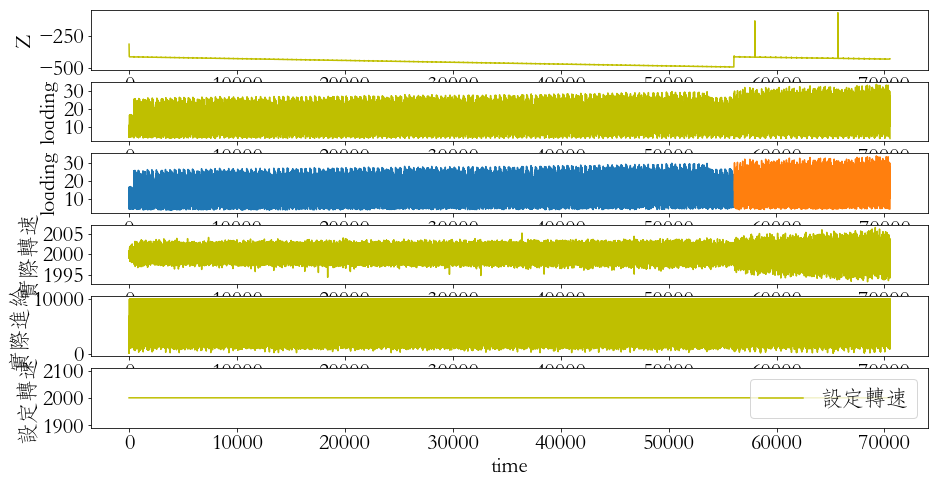

path:1, layer:2 410
path:1, layer:65 402
path:1, layer:129 404


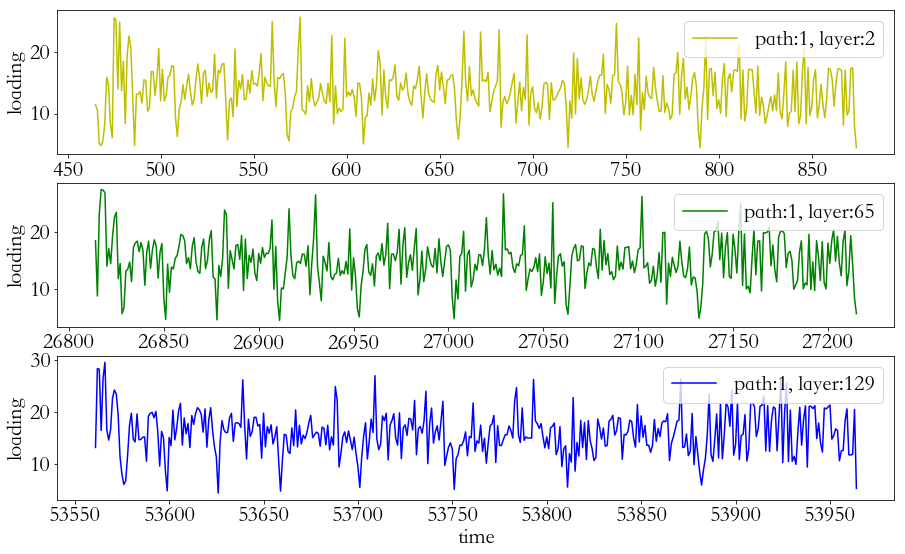

path:2, layer:2 447
path:2, layer:15 446
path:2, layer:29 446


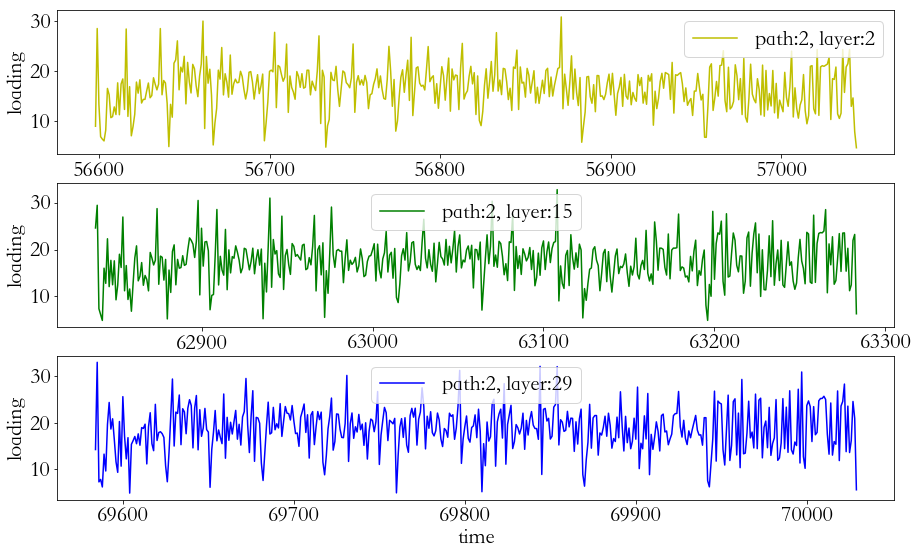

In [233]:
plc_dir = '/Users/Zion/Downloads/10-PLC/'
z10 = Deal_plc(plc_dir)



Read_plc() finish!!!
time cost: 11:15:23.942149


/Users/Zion/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:129: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


Seg_df() finish!!! time cost: 11:15:29.041838


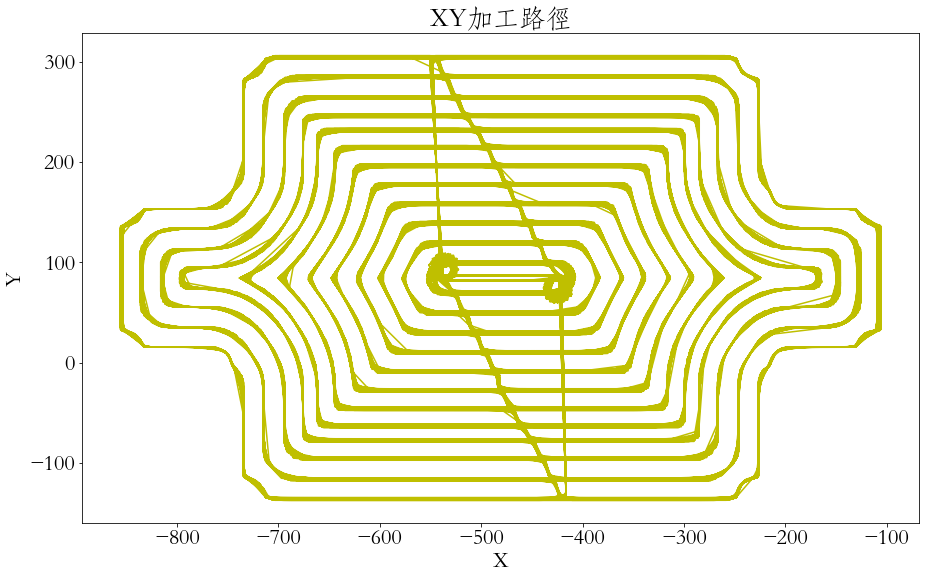

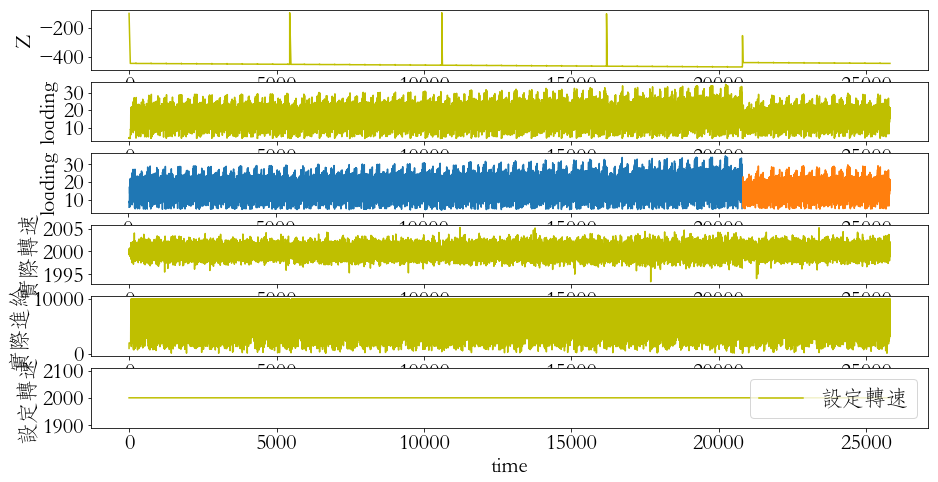

path:1, layer:2 503
path:1, layer:19 0


AttributeError: 'Series' object has no attribute 'find'

In [234]:
plc_dir = '/Users/Zion/Downloads/9-PLC/'
z9 = Deal_plc(plc_dir)


In [196]:
import numpy as np
import matplotlib.pyplot as plt
import pywt
def draw_DWT1(path, z15):
    for i in range(1,14,2):
        print('level', i)
        plt.figure(figsize=(15,9))
        coeff = pywt.wavedec(list(z15['主軸負載'].values),'db2',mode='sym',level=i)   # 按 level 层分解，使用pywt包进行计算， cAn是尺度系数 cDn为小波系数
        plt.plot(coeff[0])
        print(coeff[0])
        plt.show()

def draw_DWT(path, z15):
    z15 = z15[z15.path==path]
    plt.figure(figsize=(15,9))
    plt.subplot(411)
    plt.plot(z15['主軸負載'])
    #plt.xlabel('#data points')
    plt.ylabel('loading')
    #plt.legend(loc='best') 
    plt.title('loading in path='+str(path))
    #plt.show()
    load = list(z15['主軸負載'].values)
    idx = list(z15.index.values)
    cA, cD = pywt.dwt(list(z15['主軸負載'].values), 'db2')
    #print(cA)
    max_level = pywt.dwt_max_level(data_len=len(z15['主軸負載']), filter_len='db2')
    #print(max_level)
    coeff = pywt.wavedec(list(z15['主軸負載'].values),'db2',mode='sym', level=8)   # 按 level 层分解，使用pywt包进行计算， cAn是尺度系数 cDn为小波系数
    #print(coeff[0])
    plt.subplot(412)
    plt.plot(cA)
    #plt.xlabel('#data points')
    plt.ylabel('cA')

    plt.subplot(413)
    plt.plot(cD)
    plt.xlabel('#data points')
    plt.ylabel('cD')

    
    plt.subplot(414)
    plt.plot(coeff[0])
    plt.xlabel('#data points')
    plt.ylabel('cA_at_level=8')

    #plt.legend(loc='best') 
    #plt.title('loading in different paths')
    plt.show()
    return coeff[0], len(coeff[0])

level 1


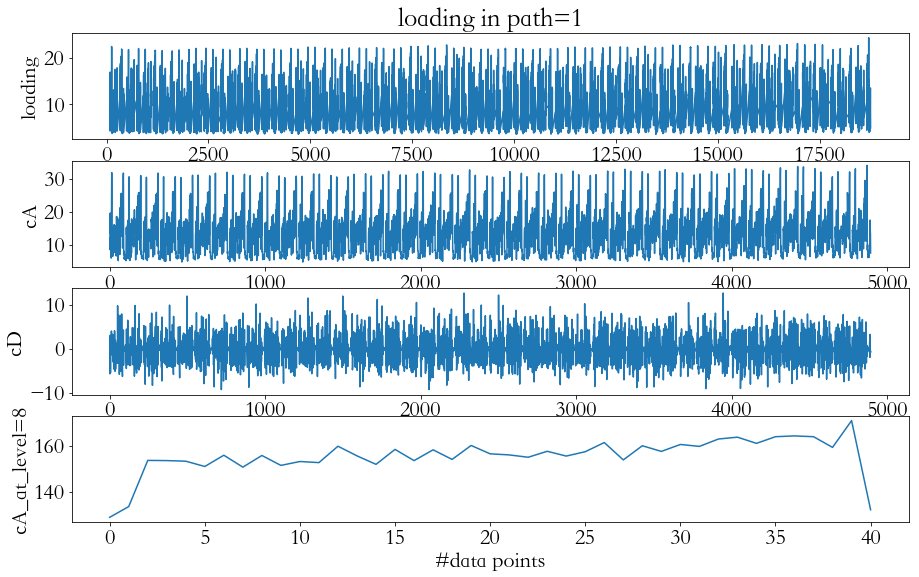

level 2


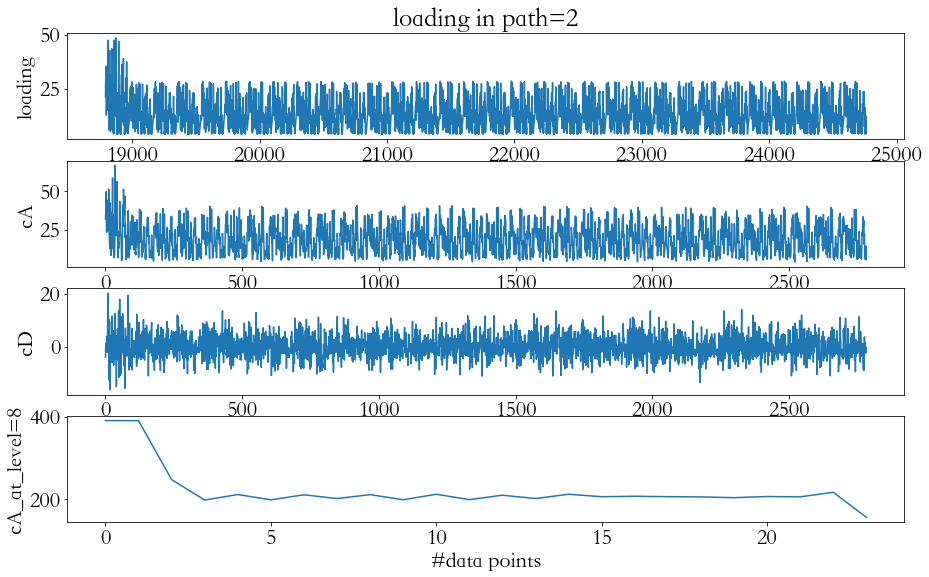

level 3


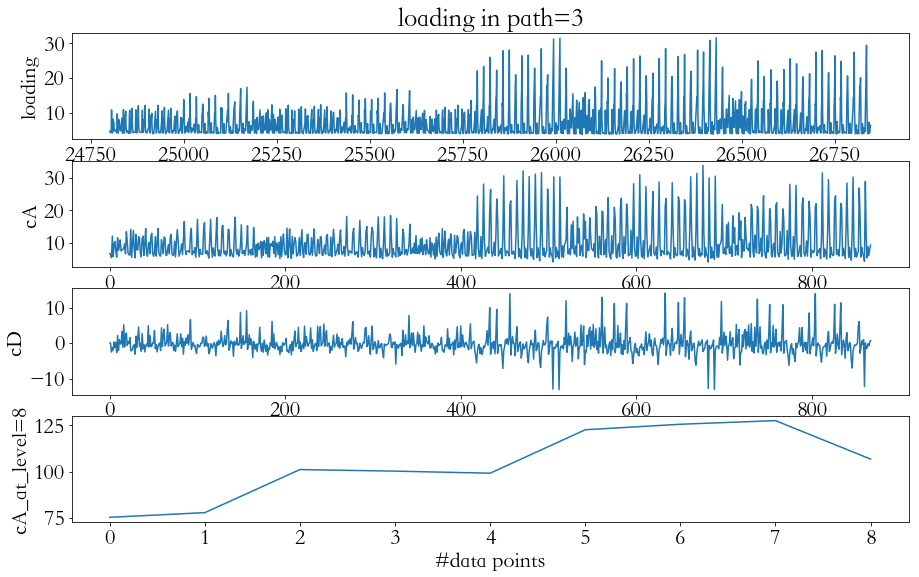

level 4


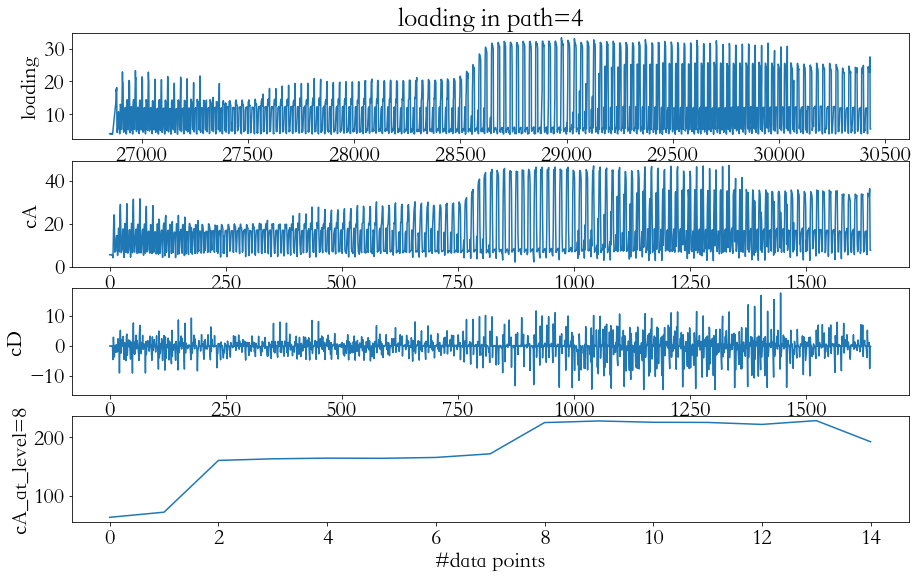

level 5


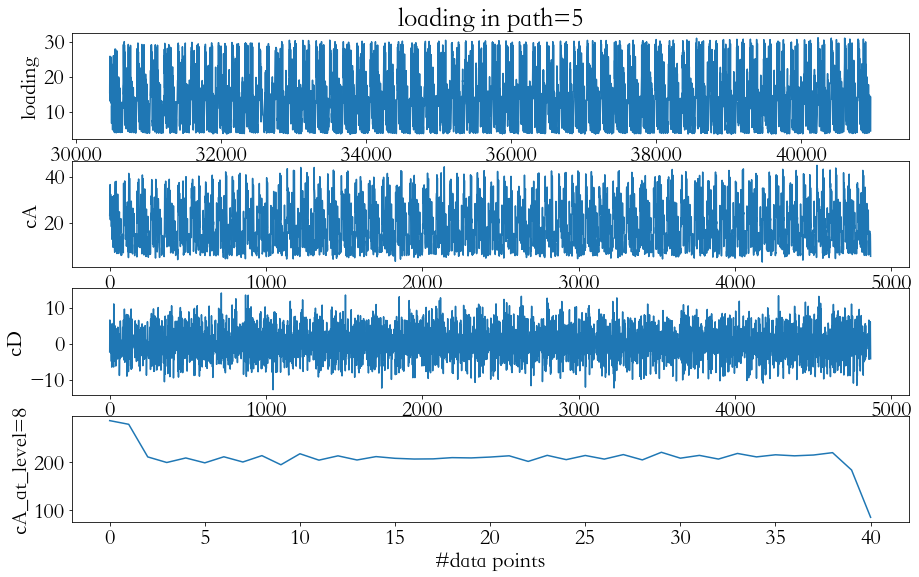

level 6


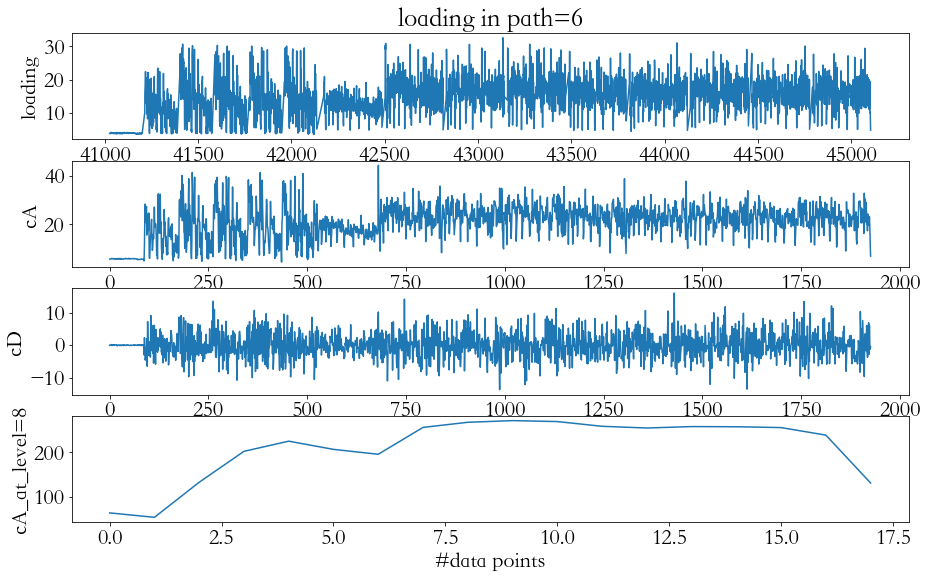

level 7


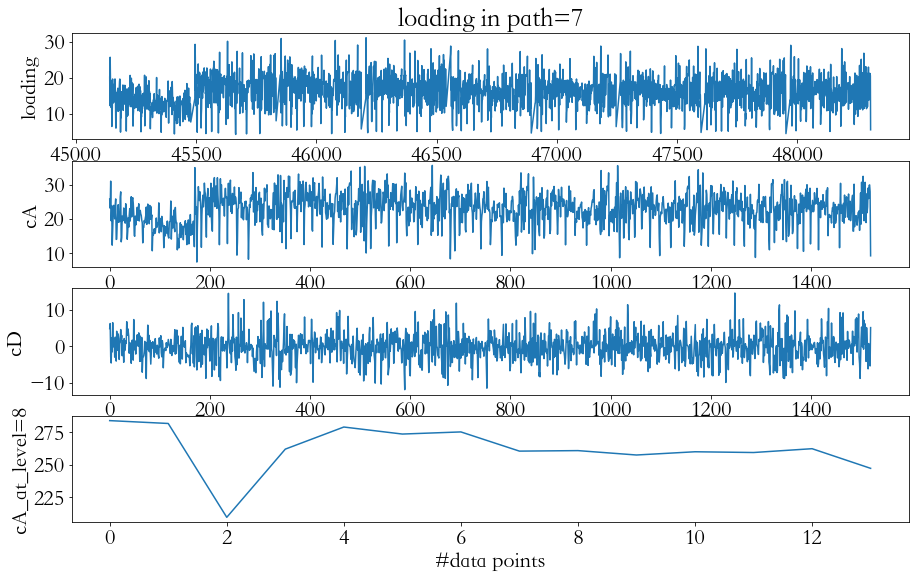

level 8


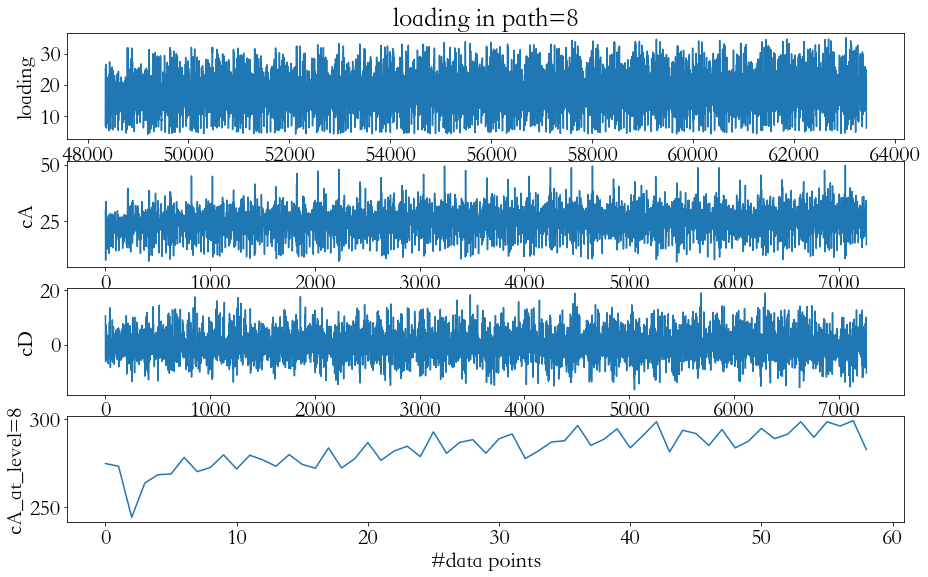

In [198]:
ca_list = []
ca_sz = []
for i in range(1,9):
    print('level', i)
    ca, sz = draw_DWT(i, z15)
    ca_list.append(list(ca))
    ca_sz.append(sz)

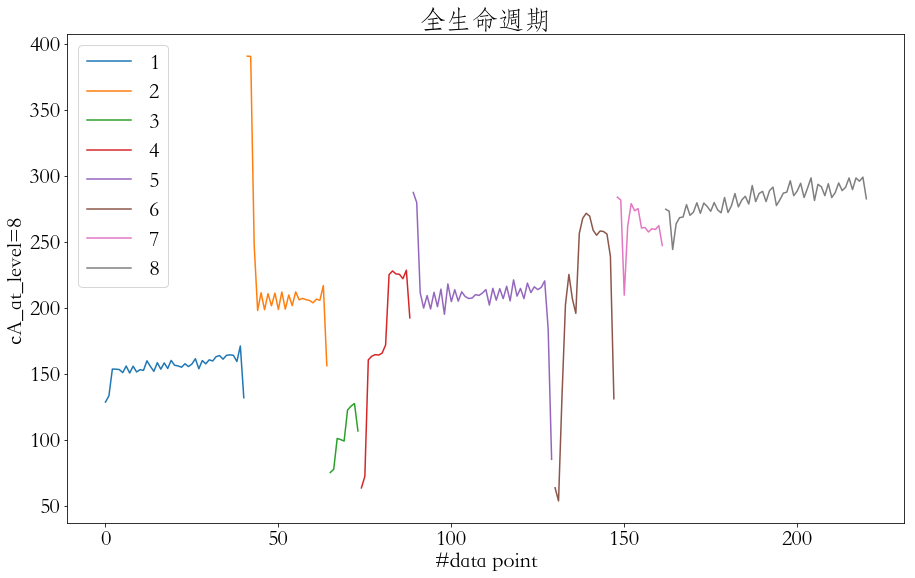

In [205]:
sz_sum = 0
colors = ['C0', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9']

plt.figure(figsize=(15,9))
for i,sz in enumerate(ca_sz):
    ca = ca_list[i]
    #plt.subplot(411)
    plt.plot(range(sz_sum,sz_sum+sz), ca, c=colors[i],label=str(i+1))
    sz_sum += sz
plt.legend(loc='best')
plt.ylabel('cA_at_level=8')
plt.xlabel('#data point')
plt.title('全生命週期')
plt.show()
       

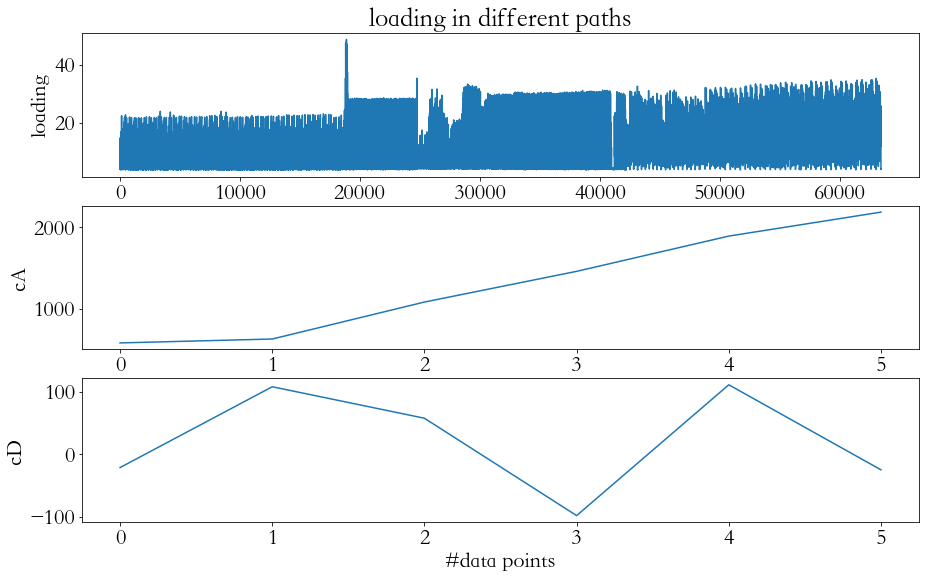

In [122]:
max_level = pywt.dwt_max_level(data_len=len(z15['主軸負載']), filter_len='db2')

plt.figure(figsize=(15,9))
plt.subplot(3,1,1)
plt.plot(z15['主軸負載'])
#plt.xlabel('#data points')
plt.ylabel('loading')
#plt.legend(loc='best') 
plt.title('loading in different paths')
#plt.show()
load = list(z15['主軸負載'].values)
idx = list(z15.index.values)
coeff = pywt.wavedec(list(z15['主軸負載'].values),'db2',mode='sym', level=14)   # 按 level 层分解，使用pywt包进行计算， cAn是尺度系数 cDn为小波系数
cA, cD = coeff[0], coeff[1]
#cA, cD = pywt.dwt(list(z15['主軸負載'].values), 'db2')
plt.subplot(3,1,2)
plt.plot(cA)
#plt.xlabel('#data points')
plt.ylabel('cA')

plt.subplot(3,1,3)
plt.plot(cD)
plt.xlabel('#data points')
plt.ylabel('cD')

#plt.legend(loc='best') 
#plt.title('loading in different paths')
plt.show()


In [ ]:
block_sz = 3000

for i in range(len(z15['主軸負載'])):
    

In [341]:
def Check_AC(z15):
    block_sz = 1000
    total_sz = len(z15)
    ca_list = []
    cd_list = []
    ca_mean = []
    cd_mean = []
    ca_std = []
    cd_std = []
    ori_mean = []
    ori_std = []
    max_level = pywt.dwt_max_level(data_len=block_sz, filter_len='db2')
    print(max_level)
    plt.figure(figsize=(10,5))
    plt.plot(z15['主軸負載'].values, c='y')
    plt.show()
    base_ca = []
    base_cd = []
    diff_ca = []
    diff_cd = []
    for i in range(1, total_sz-block_sz-1, block_sz):
        data = (list(z15.iloc[i:(i+block_sz)]['主軸負載'].values))
        coeff = pywt.wavedec(data,'db2',mode='sym', level=max_level)   # 按 level 层分解，使用pywt包进行计算， cAn是尺度系数 cDn为小波系数
        ca_list += list(coeff[0])
        cd_list += list(coeff[1])
        ca_mean.append(np.mean(coeff[0]))
        cd_mean.append(np.mean(coeff[1]))
        
        ori_mean.append(np.mean(data))
        ori_std.append(np.std(data))
        ca_std.append(np.std(coeff[0]))
        cd_std.append(np.std(coeff[1]))
        
        if i == block_sz+1:
            base_ca = list(coeff[0])
            base_cd = list(coeff[1])
        elif i > block_sz+1:
            
            #dist_ca = get_distance(base_ca, list(coeff[0]))
            #dist_cd = get_distance(base_cd, list(coeff[1]))
            #dist_ca = cosin_distance(base_ca, list(coeff[0]))
            #dist_cd = cosin_distance(base_cd, list(coeff[1]))
            dist_ca = ks_dist(base_ca, list(coeff[0]))
            dist_cd = ks_dist(base_cd, list(coeff[1]))
            
            print(len(base_ca), len(coeff[0]))
            print(dist_ca, dist_cd)
            diff_ca.append(dist_ca)
            diff_cd.append(dist_cd)
            
            
    plt.figure(figsize=(10,5))
    plt.plot(ca_list, c='g')
    plt.ylabel('cA')
    plt.xlabel('#data point')
    plt.title('dwt on every '+str(block_sz)+' data')

    plt.show()

    plt.figure(figsize=(10,5))
    plt.plot(cd_list, c='b')
    plt.ylabel('cD')
    plt.xlabel('#data point')
    plt.title('dwt on every '+str(block_sz)+' data')
    plt.show()

    plt.figure(figsize=(10,5))
    plt.plot(ca_std, c='b')
    plt.ylabel('cA_std')
    plt.xlabel('#data point')
    plt.title('dwt on every '+str(block_sz)+' data')
    plt.show()

    plt.figure(figsize=(10,5))
    plt.plot(cd_std, c='b')
    plt.ylabel('cD_std')
    plt.xlabel('#data point')
    plt.title('dwt on every '+str(block_sz)+' data')
    plt.show()

    plt.figure(figsize=(10,5))
    plt.plot(ca_mean, c='g')
    plt.ylabel('cA_mean')
    plt.xlabel('#data point')
    plt.title('dwt on every '+str(block_sz)+' data')
    plt.show()
    
    plt.figure(figsize=(10,5))
    plt.plot(cd_mean, c='b')
    plt.ylabel('cD_mean')
    plt.xlabel('#data point')
    plt.title('dwt on every '+str(block_sz)+' data')
    plt.show()
    
    plt.figure(figsize=(10,5))
    plt.plot(ori_mean, c='b')
    plt.ylabel('ori_mean')
    plt.xlabel('#data point')
    plt.title('dwt on every '+str(block_sz)+' data')
    plt.show()
    
    
    plt.figure(figsize=(10,5))
    plt.plot(ori_std, c='b')
    plt.ylabel('ori_std')
    plt.xlabel('#data point')
    plt.title('dwt on every '+str(block_sz)+' data')
    plt.show()
    
    plt.figure(figsize=(10,5))
    plt.plot(diff_ca, c='b')
    plt.ylabel('diff_ca')
    plt.xlabel('#data point')
    plt.title('dwt on every '+str(block_sz)+' data')
    plt.show()
    
    plt.figure(figsize=(10,5))
    plt.plot(diff_cd, c='b')
    plt.ylabel('diff_cd')
    plt.xlabel('#data point')
    plt.title('dwt on every '+str(block_sz)+' data')
    plt.show()

In [342]:
import math
from scipy import stats

def ks_dist(d1, d2):
    return stats.ks_2samp(d1, d2)[0]
def get_distance(data1, data2):
    points = zip(data1, data2)
    diffs_squared_distance = [pow(a - b, 2) for (a, b) in points]
    return math.sqrt(sum(diffs_squared_distance))
def cosin_distance(vector1, vector2):
    dot_product = 0.0
    normA = 0.0
    normB = 0.0
    for a, b in zip(vector1, vector2):
        dot_product += a * b
        normA += a ** 2
        normB += b ** 2
    if normA == 0.0 or normB == 0.0:
        return None
    else:
        return dot_product / ((normA * normB) ** 0.5)


In [370]:
def Check_AC_by_path(z15):
    t_path = z15.path.nunique()
    for p in range(1, t_path+1):
        tmp_z = z15[z15.path==p]
        base_z = tmp_z[tmp_z.layer==2]
        base_sz = int(len(base_z) * 0.8)
        layer_count = tmp_z.layer.nunique()
        print('Path ', p, ', base_z sz ', base_sz, 'layer_count', layer_count)
        if base_sz <50:
            continue
        block_sz = base_sz
        ca_list = []
        cd_list = []
        ca_mean = []
        cd_mean = []
        ca_std = []
        cd_std = []
        ori_mean = []
        ori_std = []
        max_level = pywt.dwt_max_level(data_len=block_sz, filter_len='db2')
        print('max_level', max_level)
        plt.figure(figsize=(10,5))
        plt.plot(base_z['主軸負載'].values, c='y')
        plt.xlabel('#data point')
        plt.ylabel('loading')
        plt.show()
        base_ca = []
        base_cd = []
        diff_ca = []
        diff_cd = []
        comp_ca = []
        comp_cd = []
        for l in range(2, layer_count+1):
            data = tmp_z[tmp_z.layer==l]['主軸負載'].values
            coeff = pywt.wavedec(data,'db2',mode='sym', level=1)   # 按 level 层分解，使用pywt包进行计算， cAn是尺度系数 cDn为小波系数
            ca_list += list(coeff[0])
            cd_list += list(coeff[1])
            ca_mean.append(np.mean(coeff[0]))
            cd_mean.append(np.mean(coeff[1]))

            ori_mean.append(np.mean(data))
            ori_std.append(np.std(data))
            ca_std.append(np.std(coeff[0]))
            cd_std.append(np.std(coeff[1]))
            comp_ca += list(coeff[0])
            comp_cd += list(coeff[1])

            if l == 2:
                base_ca = list(coeff[0])
                base_cd = list(coeff[1])
                
                print('base ca len', len(base_ca))
            elif l > 2:

                #dist_ca = get_distance(base_ca, list(coeff[0]))
                #dist_cd = get_distance(base_cd, list(coeff[1]))
                #dist_ca = cosin_distance(base_ca, list(coeff[0]))
                #dist_cd = cosin_distance(base_cd, list(coeff[1]))
                #dist_ca = ks_dist(base_ca, list(coeff[0]))
                #dist_cd = ks_dist(base_cd, list(coeff[1]))

                dist_ca = ks_dist(base_ca, comp_ca)
                dist_cd = ks_dist(base_cd, comp_cd)

                #print(len(base_ca), len(coeff[0]))
                #print(dist_ca, dist_cd)
                diff_ca.append(dist_ca)
                diff_cd.append(dist_cd)

        plt.figure(figsize=(10,5))
        plt.plot(ca_list, c='g')
        plt.ylabel('cA')
        plt.xlabel('#data point')
        plt.title('dwt on every '+str(block_sz)+' data at path = '+str(p))

        plt.show()

        plt.figure(figsize=(10,5))
        plt.plot(cd_list, c='b')
        plt.ylabel('cD')
        plt.xlabel('#data point')
        plt.title('dwt on every '+str(block_sz)+' data at path = '+str(p))

        plt.show()

        plt.figure(figsize=(10,5))
        plt.plot(ca_std, c='b')
        plt.ylabel('cA_std')
        plt.xlabel('#data point')
        plt.title('dwt on every '+str(block_sz)+' data at path = '+str(p))
        plt.show()

        plt.figure(figsize=(10,5))
        plt.plot(cd_std, c='b')
        plt.ylabel('cD_std')
        plt.xlabel('#data point')
        plt.title('dwt on every '+str(block_sz)+' data at path = '+str(p))
        plt.show()

        plt.figure(figsize=(10,5))
        plt.plot(ca_mean, c='g')
        plt.ylabel('cA_mean')
        plt.xlabel('#data point')
        plt.title('dwt on every '+str(block_sz)+' data at path = '+str(p))
        plt.show()

        plt.figure(figsize=(10,5))
        plt.plot(cd_mean, c='b')
        plt.ylabel('cD_mean')
        plt.xlabel('#data point')
        plt.title('dwt on every '+str(block_sz)+' data at path = '+str(p))
        plt.show()

        plt.figure(figsize=(10,5))
        plt.plot(ori_mean, c='b')
        plt.ylabel('ori_mean')
        plt.xlabel('#data point')
        plt.title('dwt on every '+str(block_sz)+' data at path = '+str(p))
        plt.show()


        plt.figure(figsize=(10,5))
        plt.plot(ori_std, c='b')
        plt.ylabel('ori_std')
        plt.xlabel('#data point')
        plt.title('dwt on every '+str(block_sz)+' data at path = '+str(p))
        plt.show()

        plt.figure(figsize=(10,5))
        plt.plot(diff_ca, c='b')
        plt.ylabel('diff_ca')
        plt.xlabel('#data point')
        plt.title('dwt on every '+str(block_sz)+' data at path = '+str(p))
        plt.show()

        plt.figure(figsize=(10,5))
        plt.plot(diff_cd, c='b')
        plt.ylabel('diff_cd')
        plt.xlabel('#data point')
        plt.title('dwt on every '+str(block_sz)+' data at path = '+str(p))
        plt.show()

Path  1 , base_z sz  89 layer_count 83
max_level 4


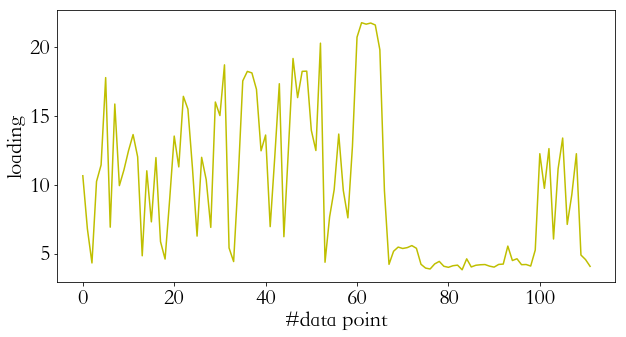

base ca len 57


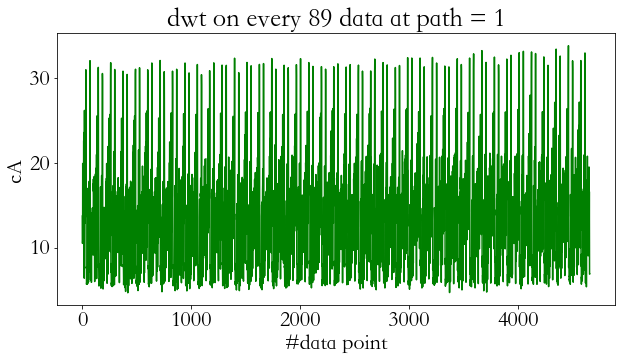

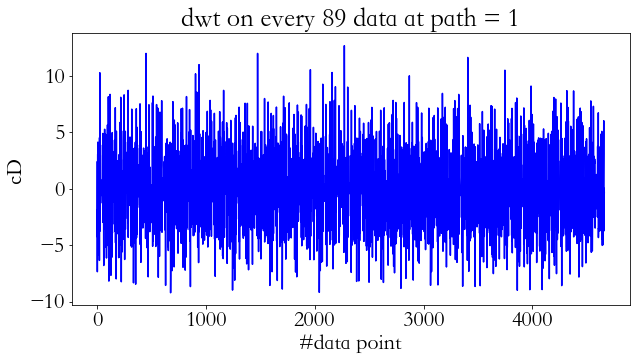

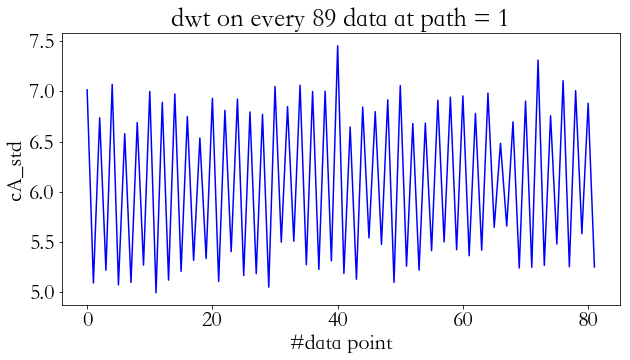

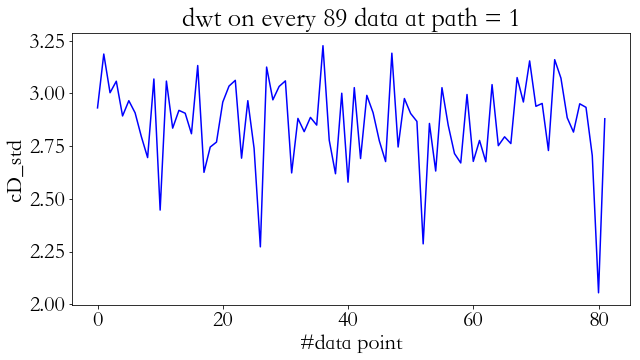

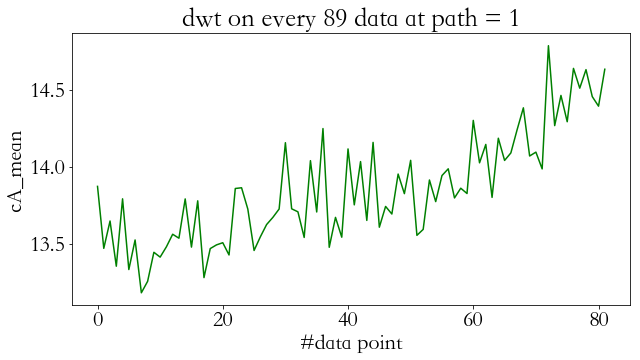

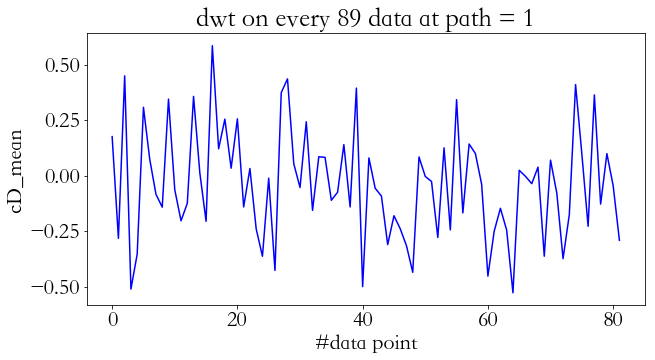

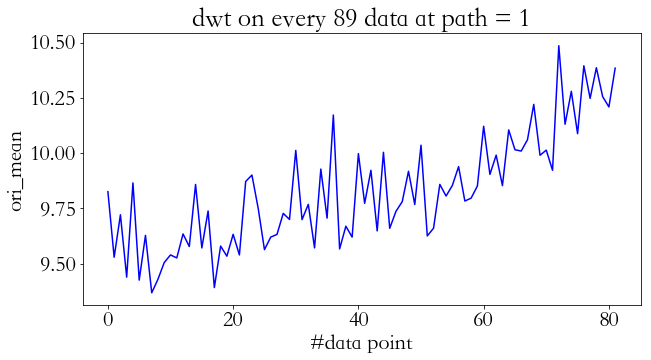

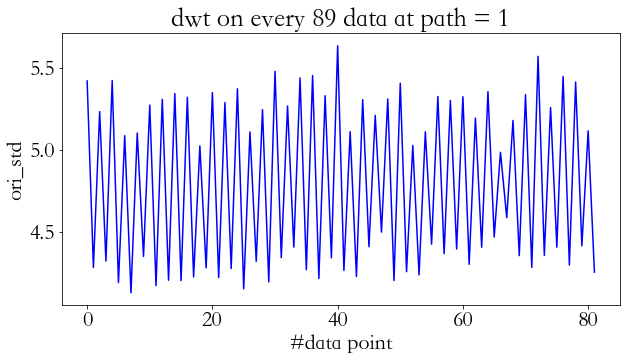

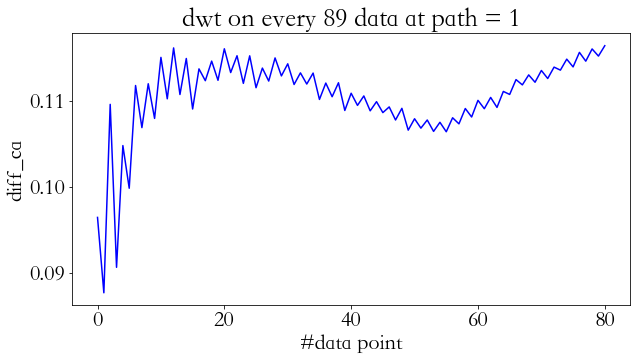

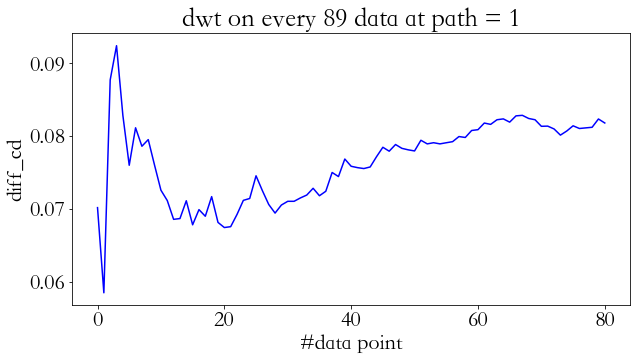

Path  2 , base_z sz  139 layer_count 32
max_level 5


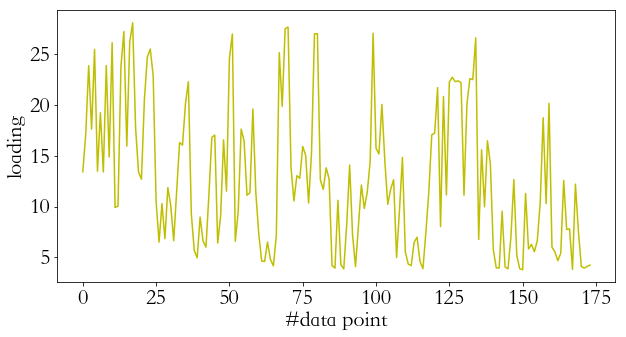

base ca len 88


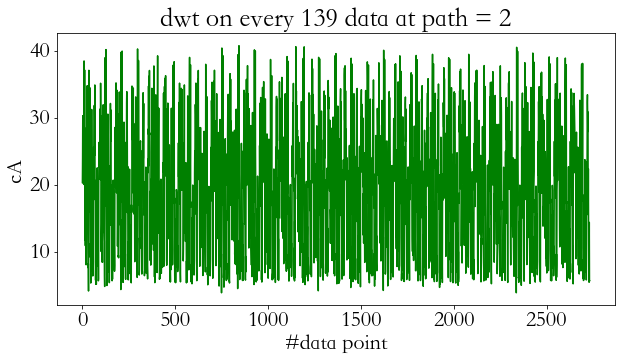

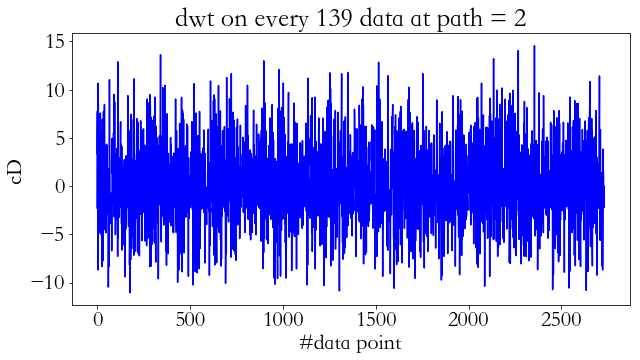

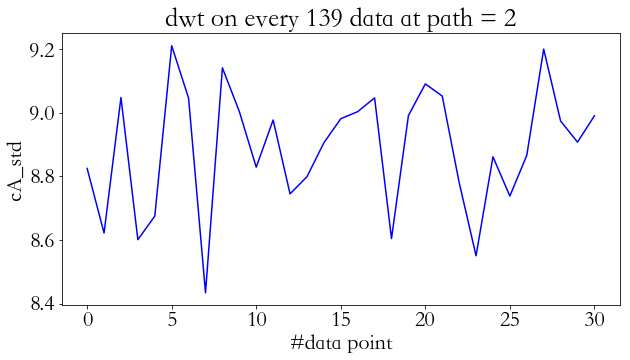

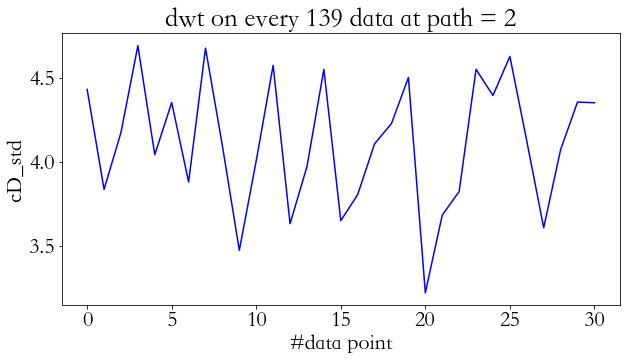

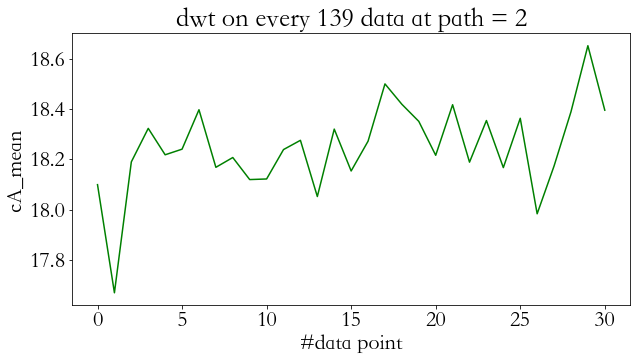

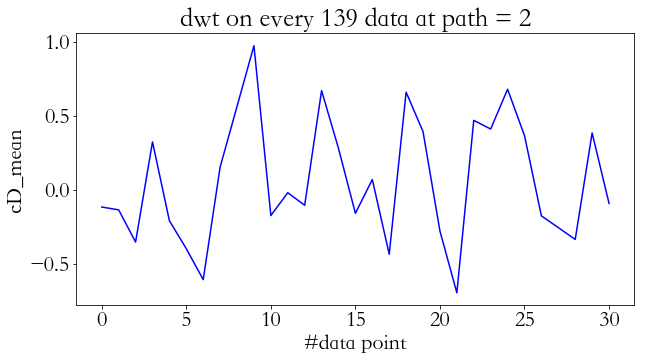

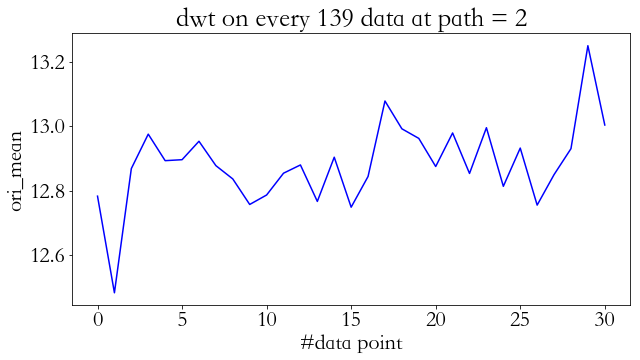

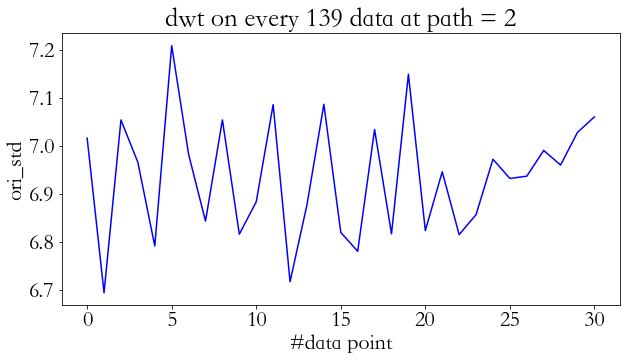

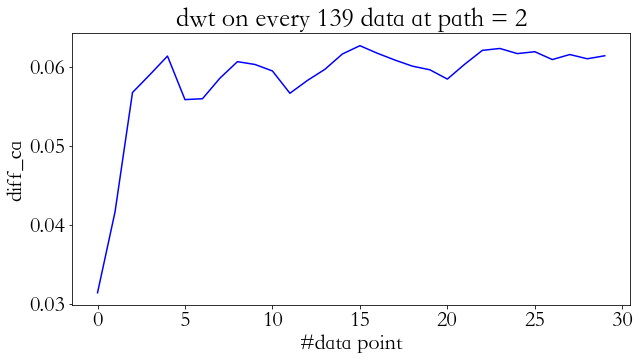

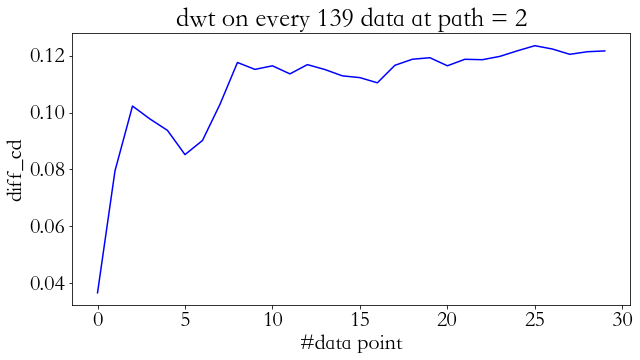

Path  3 , base_z sz  11 layer_count 113
Path  4 , base_z sz  22 layer_count 113
Path  5 , base_z sz  139 layer_count 56
max_level 5


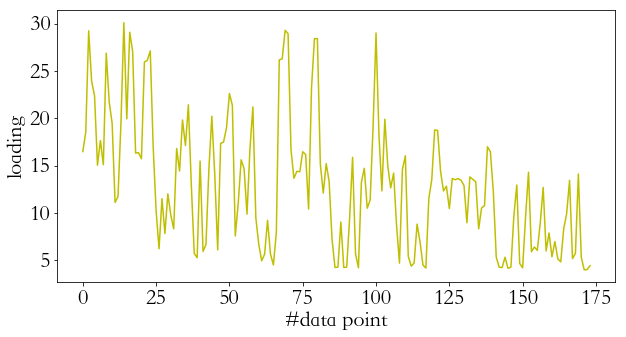

base ca len 88


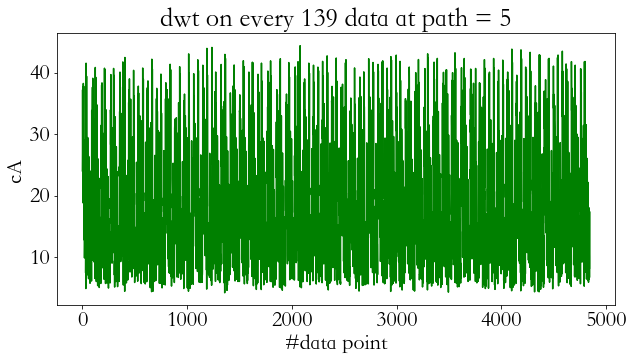

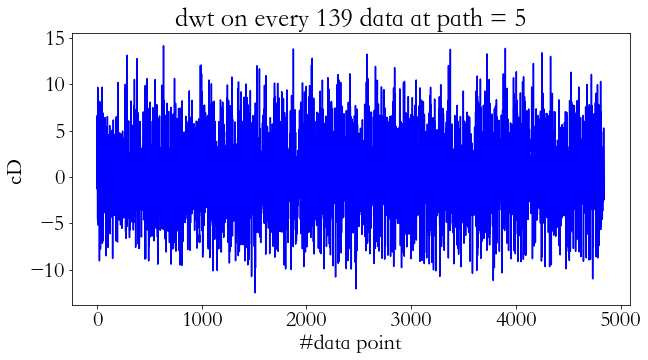

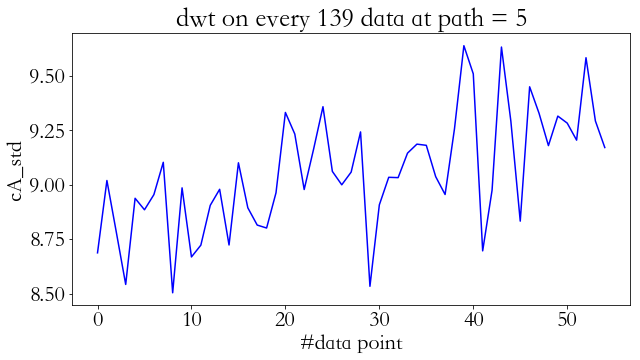

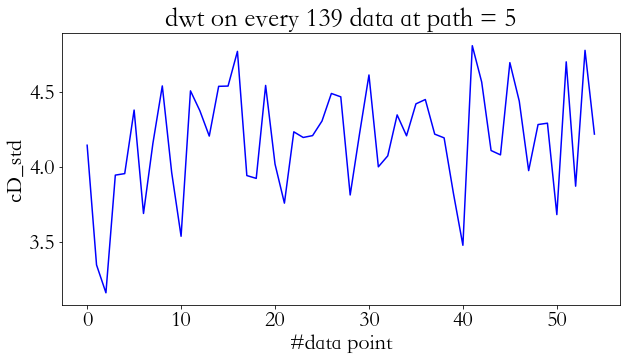

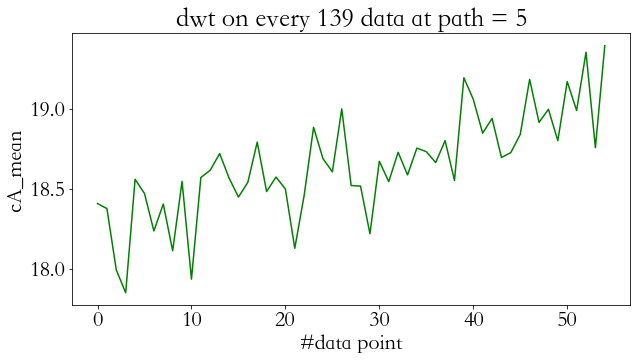

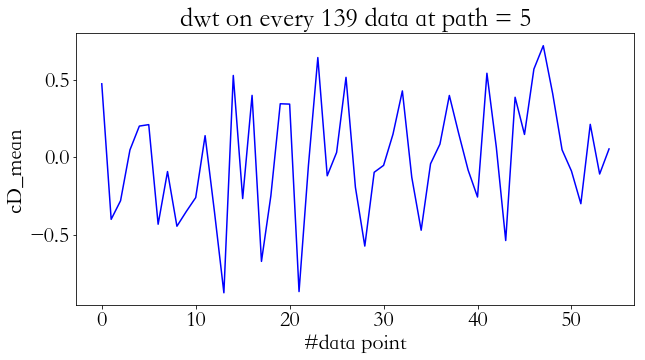

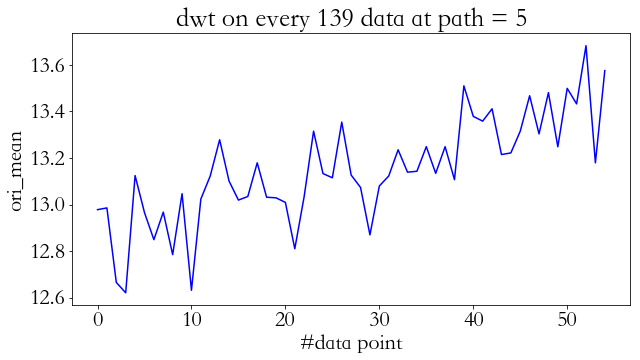

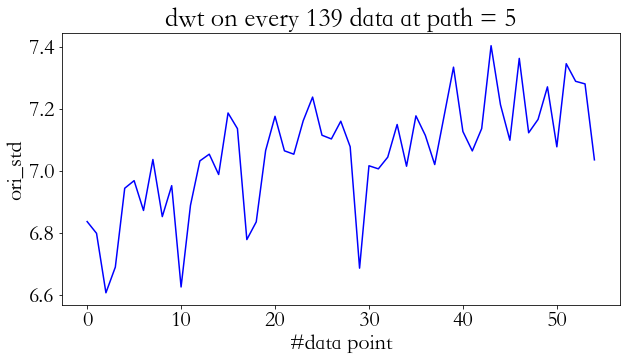

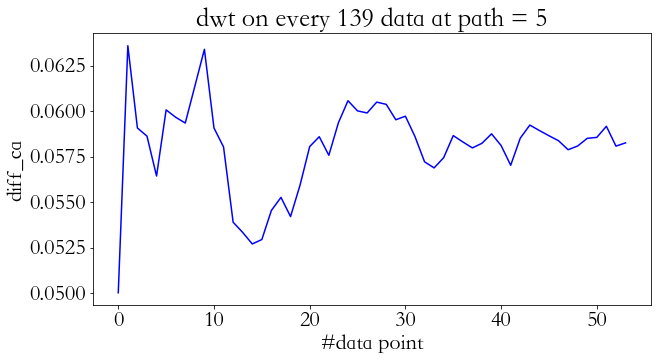

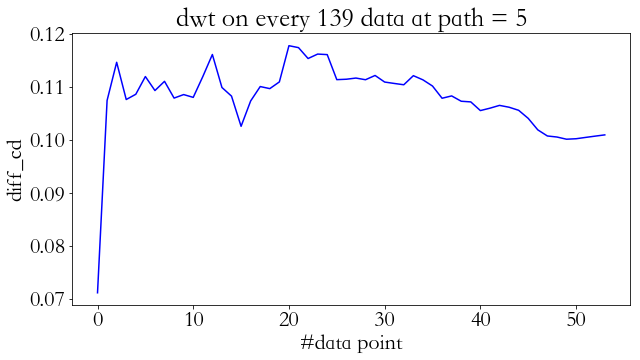

Path  6 , base_z sz  249 layer_count 6
max_level 6


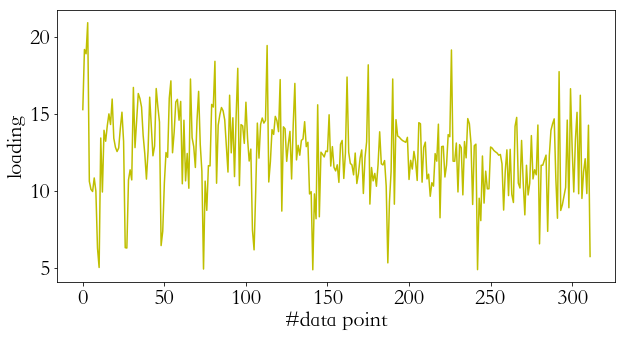

base ca len 157


/Users/Zion/anaconda/lib/python3.6/site-packages/pywt/_multilevel.py:45: UserWarning: Level value of 1 is too high: all coefficients will experience boundary effects.
  "boundary effects.").format(level))


ValueError: Value of data_len must be greater than zero.

In [371]:
Check_AC_by_path(z15)

8


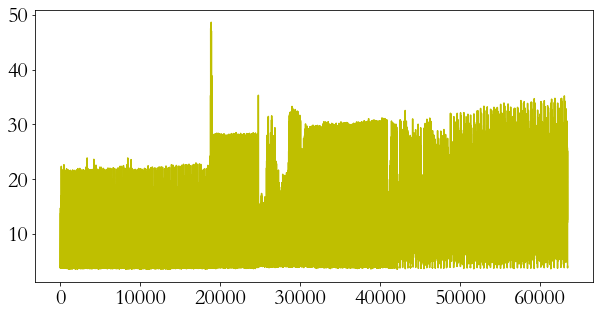

6 6
0.33333333333333337 0.3333333333333333
6 6
0.5 0.5
6 6
0.5 0.33333333333333337
6 6
0.33333333333333337 0.33333333333333337
6 6
0.5 0.33333333333333337
6 6
0.33333333333333337 0.5
6 6
0.5 0.33333333333333337
6 6
0.5 0.3333333333333333
6 6
0.33333333333333337 0.5
6 6
0.33333333333333337 0.33333333333333337
6 6
0.5 0.33333333333333337
6 6
0.33333333333333337 0.33333333333333337
6 6
0.33333333333333337 0.3333333333333333
6 6
0.33333333333333337 0.33333333333333337
6 6
0.3333333333333333 0.5
6 6
0.33333333333333337 0.33333333333333337
6 6
0.33333333333333337 0.33333333333333337
6 6
1.0 0.33333333333333337
6 6
0.6666666666666667 0.33333333333333337
6 6
1.0 0.3333333333333333
6 6
1.0 0.33333333333333337
6 6
1.0 0.5
6 6
0.8333333333333334 0.33333333333333337
6 6
1.0 0.33333333333333337
6 6
0.8333333333333334 0.33333333333333337
6 6
0.6666666666666667 0.3333333333333333
6 6
1.0 0.33333333333333337
6 6
1.0 0.3333333333333333
6 6
1.0 0.5
6 6
0.6666666666666667 0.5
6 6
1.0 0.33333333333333337


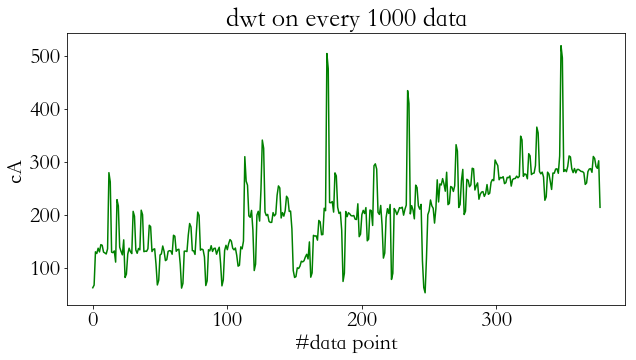

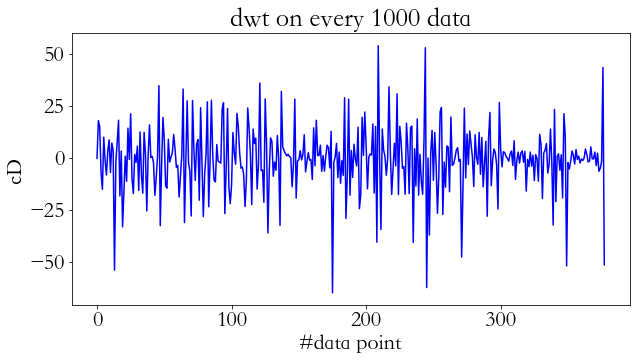

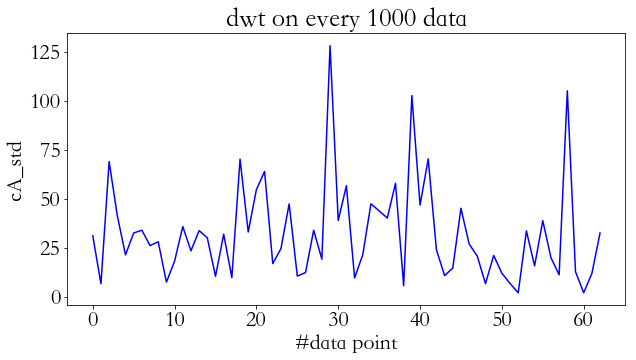

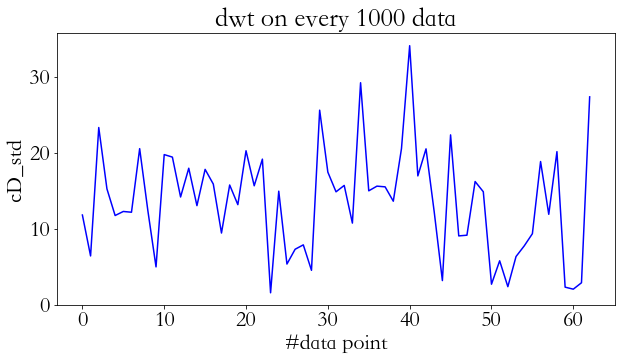

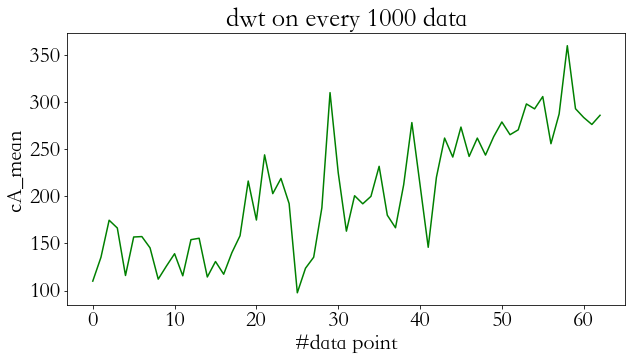

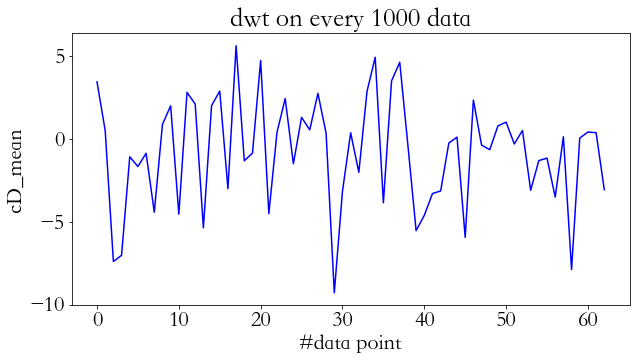

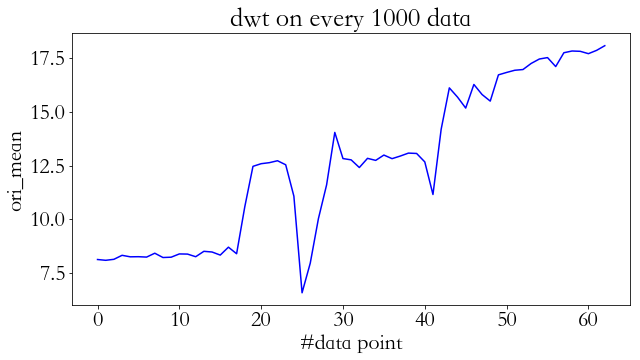

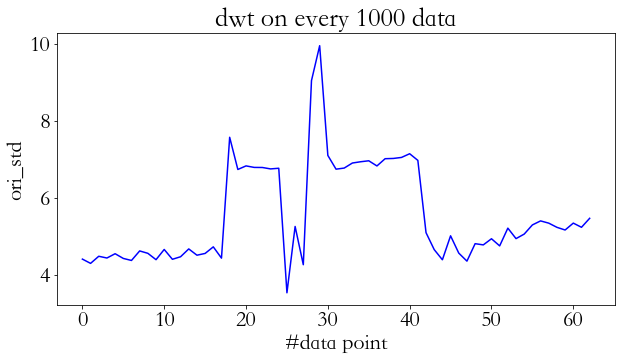

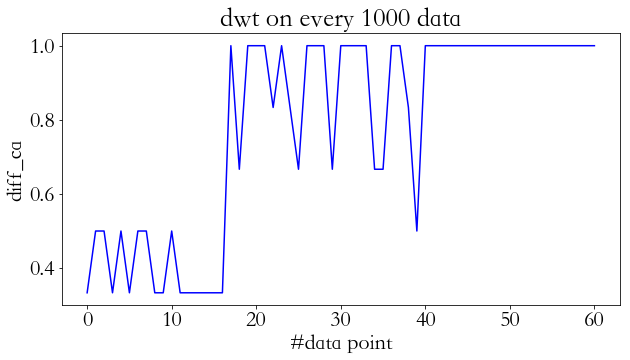

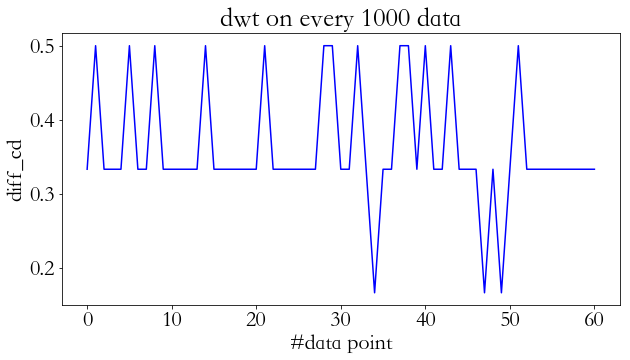

In [343]:
Check_AC(z15)

8


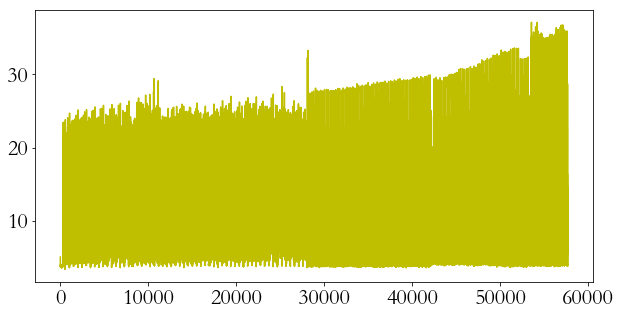

6 6
0.5 0.3333333333333333
6 6
0.16666666666666674 0.33333333333333337
6 6
0.33333333333333337 0.33333333333333337
6 6
0.33333333333333337 0.16666666666666674
6 6
0.3333333333333333 0.33333333333333337
6 6
0.16666666666666674 0.16666666666666674
6 6
0.33333333333333337 0.33333333333333337
6 6
0.6666666666666667 0.33333333333333337
6 6
0.5 0.3333333333333333
6 6
0.3333333333333333 0.16666666666666674
6 6
0.5 0.5
6 6
0.8333333333333334 0.5
6 6
0.6666666666666667 0.33333333333333337
6 6
0.6666666666666667 0.3333333333333333
6 6
0.33333333333333337 0.3333333333333333
6 6
0.33333333333333337 0.3333333333333333
6 6
0.5 0.16666666666666674
6 6
0.8333333333333334 0.33333333333333337
6 6
0.5 0.33333333333333337
6 6
0.8333333333333334 0.33333333333333337
6 6
0.8333333333333334 0.3333333333333333
6 6
0.5 0.3333333333333333
6 6
0.33333333333333337 0.3333333333333333
6 6
0.8333333333333334 0.33333333333333337
6 6
0.5 0.3333333333333333
6 6
0.8333333333333334 0.33333333333333337
6 6
0.5 0.1666666666

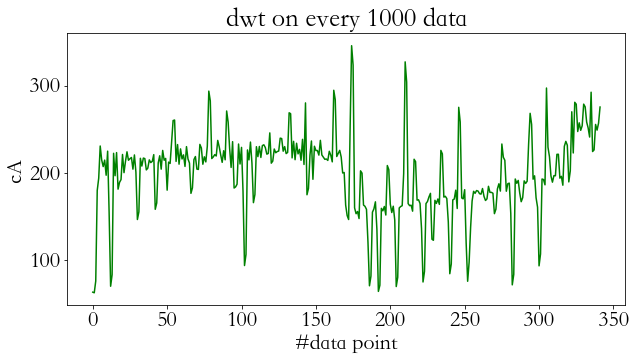

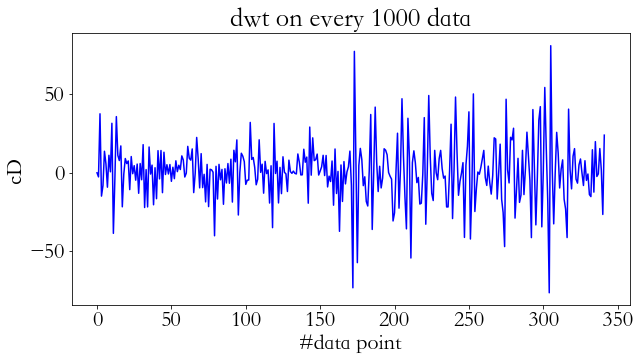

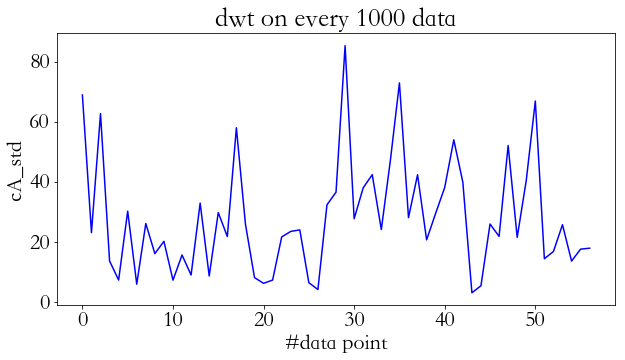

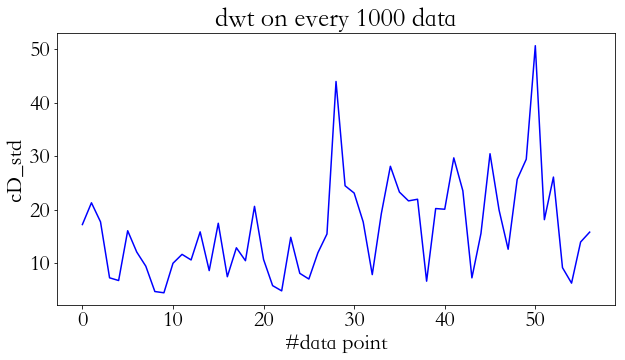

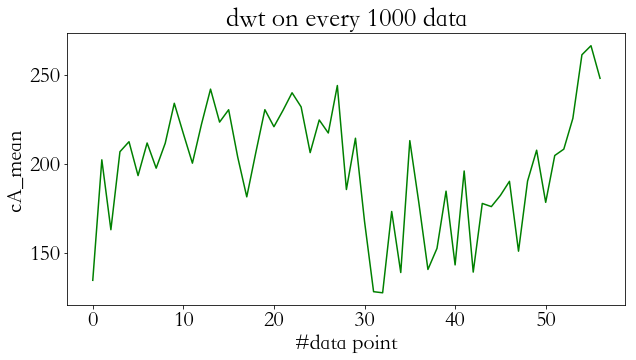

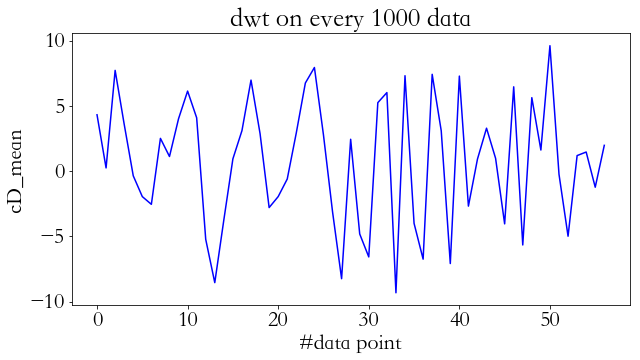

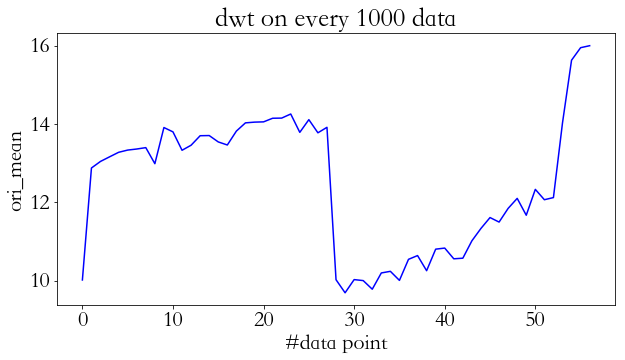

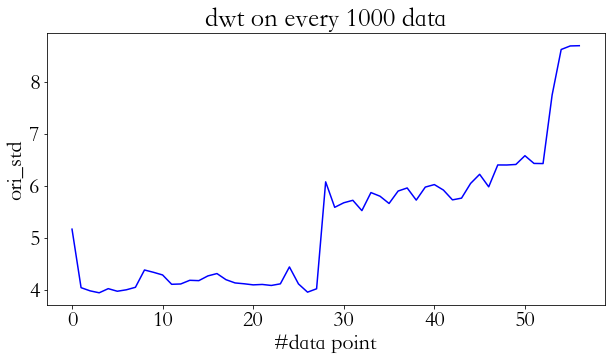

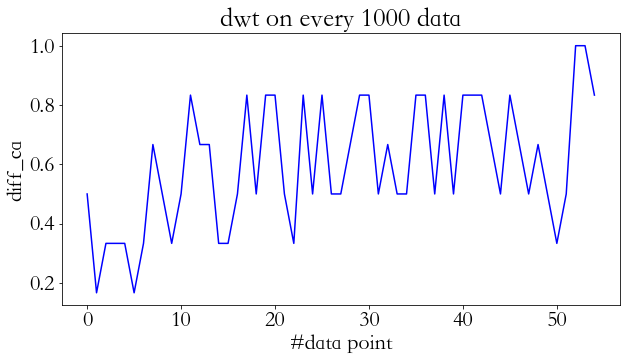

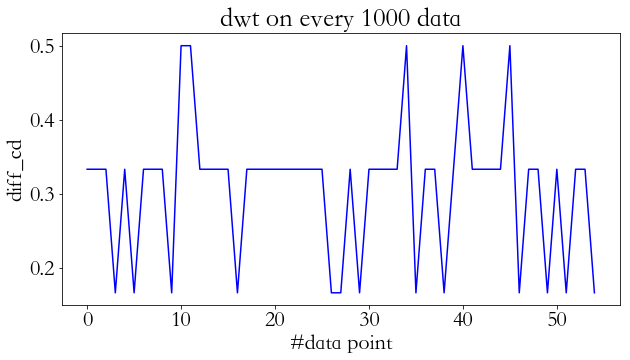

In [344]:
Check_AC(z14)

8


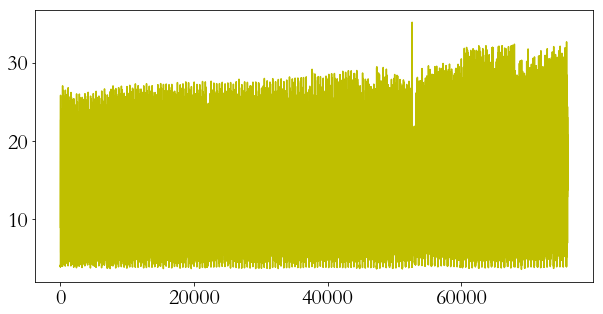

10 14
0.15714285714285714 0.18571428571428572
10 18
0.18888888888888888 0.2333333333333334
10 22
0.20909090909090908 0.18181818181818182
10 26
0.22307692307692306 0.24615384615384617
10 30
0.23333333333333334 0.2333333333333334
10 34
0.24705882352941172 0.22352941176470587
10 38
0.25789473684210523 0.21578947368421053
10 42
0.3142857142857143 0.2571428571428571
10 45
0.3333333333333333 0.24444444444444446
10 49
0.36734693877551017 0.2571428571428571
10 53
0.39622641509433965 0.26792452830188684
10 57
0.4385964912280702 0.2771929824561403
10 61
0.4426229508196722 0.26885245901639343
10 65
0.49230769230769234 0.27692307692307694
10 69
0.5072463768115942 0.2840579710144928
10 73
0.547945205479452 0.2904109589041096
10 77
0.5714285714285714 0.2831168831168831
10 81
0.5925925925925926 0.28888888888888886
10 85
0.611764705882353 0.3058823529411765
10 88
0.6136363636363636 0.3090909090909091
10 92
0.6195652173913043 0.29130434782608694
10 96
0.6354166666666667 0.30625
10 100
0.65 0.2900000000

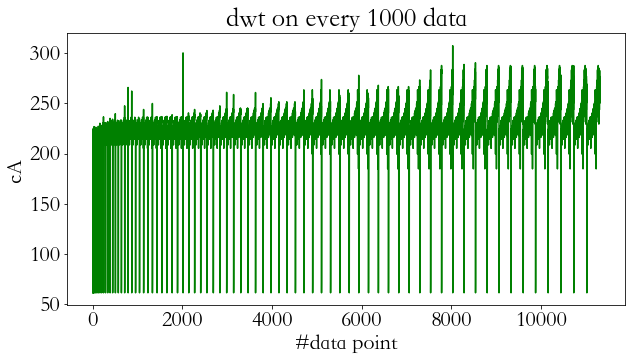

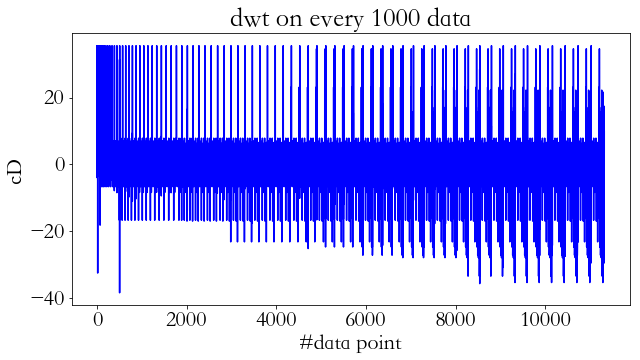

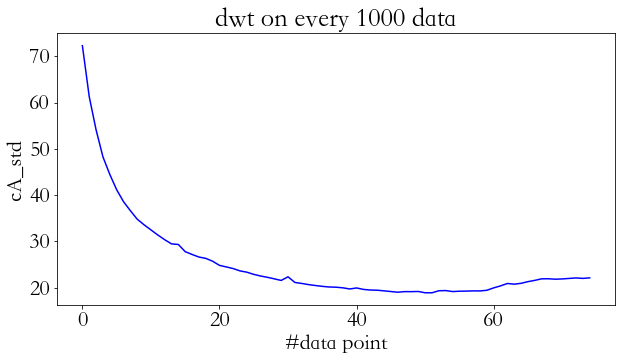

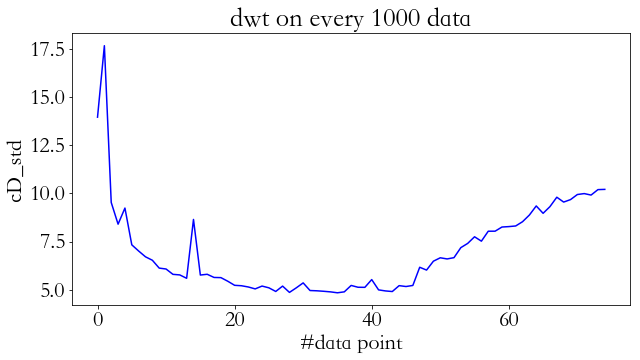

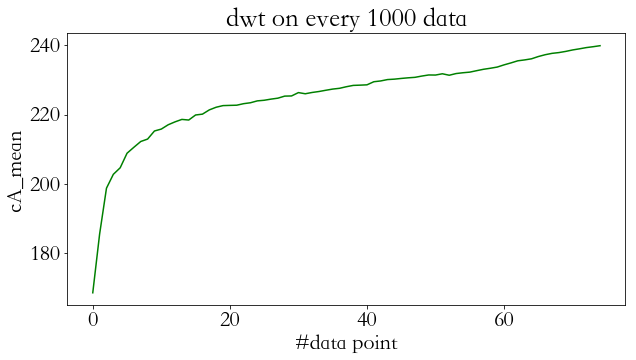

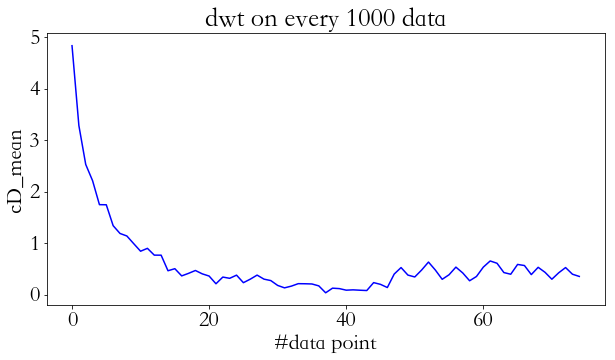

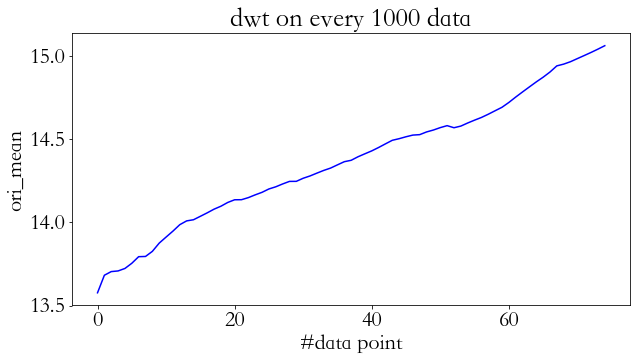

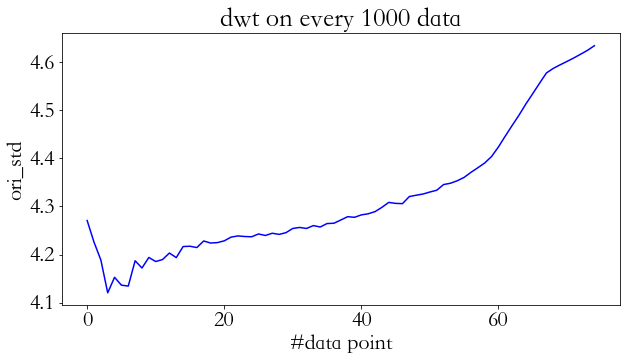

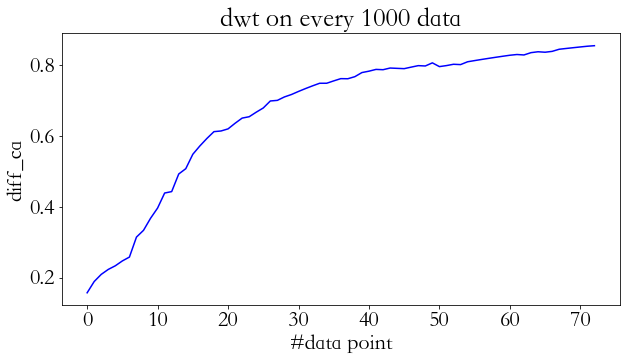

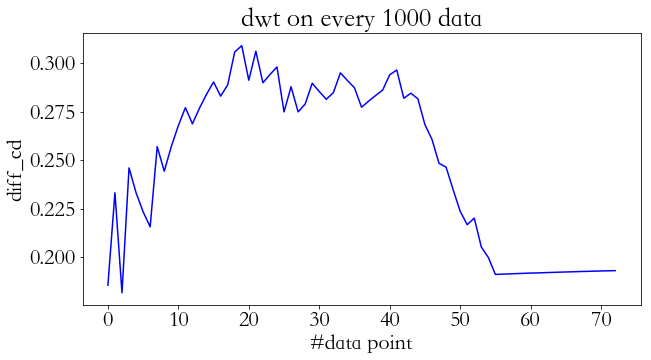

In [325]:
Check_AC(z13)

8


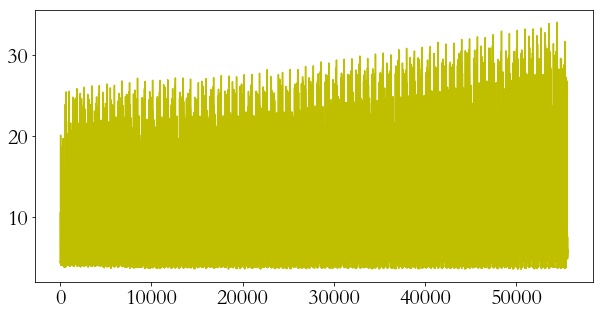

10 14
0.12857142857142856 0.2571428571428571
10 18
0.19999999999999996 0.2333333333333334
10 22
0.24545454545454543 0.1636363636363637
10 26
0.2384615384615384 0.18461538461538463
10 30
0.29999999999999993 0.20000000000000007
10 34
0.2588235294117647 0.1823529411764706
10 38
0.3052631578947368 0.1947368421052632
10 42
0.319047619047619 0.20952380952380956
10 45
0.29999999999999993 0.18888888888888888
10 49
0.3530612244897959 0.17755102040816328
10 53
0.34150943396226413 0.1924528301886793
10 57
0.36666666666666664 0.17719298245614035
10 61
0.3721311475409836 0.16885245901639345
10 65
0.3615384615384615 0.17692307692307696
10 69
0.38115942028985506 0.18405797101449284
10 73
0.38493150684931504 0.17671232876712328
10 77
0.3753246753246753 0.18311688311688312
10 81
0.391358024691358 0.17654320987654326
10 85
0.39411764705882346 0.1705882352941177
10 88
0.4045454545454545 0.1636363636363637
10 92
0.3956521739130434 0.16956521739130437
10 96
0.41874999999999996 0.17500000000000004
10 100
0.

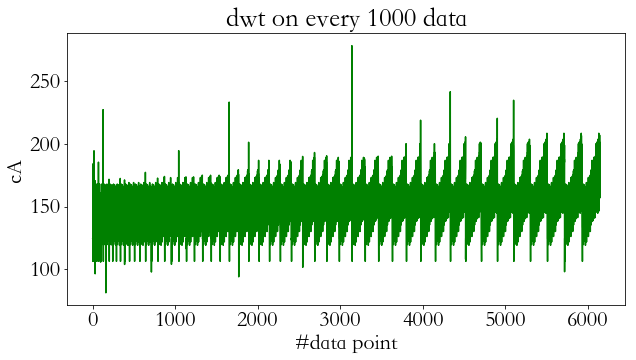

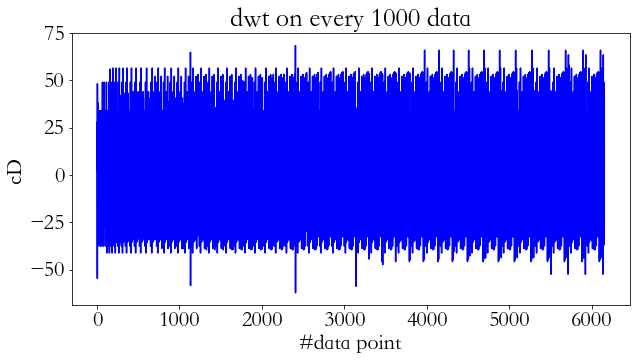

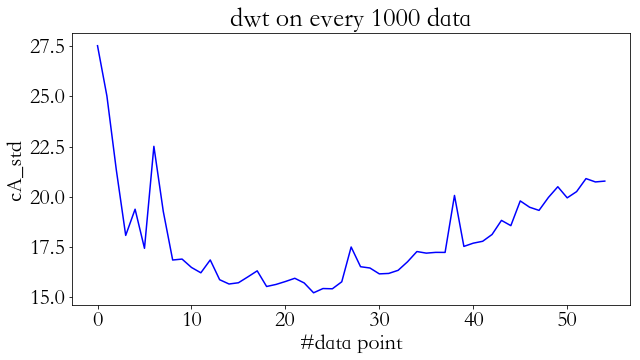

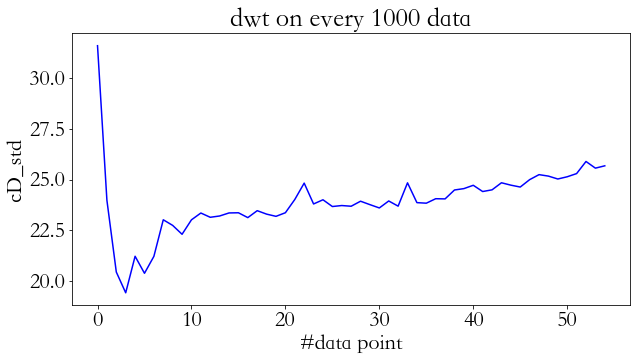

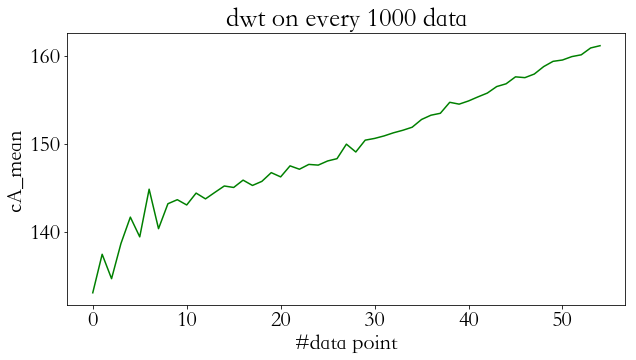

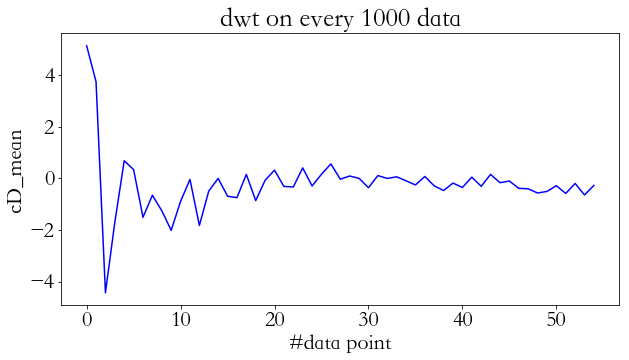

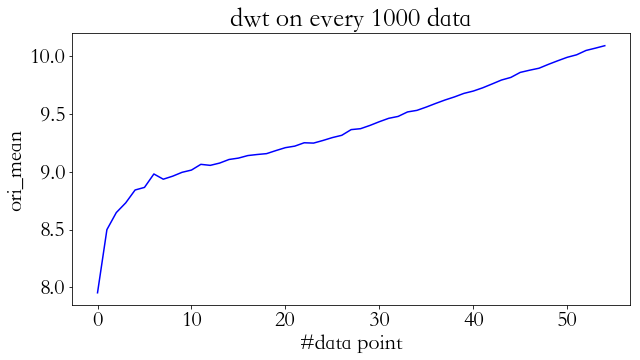

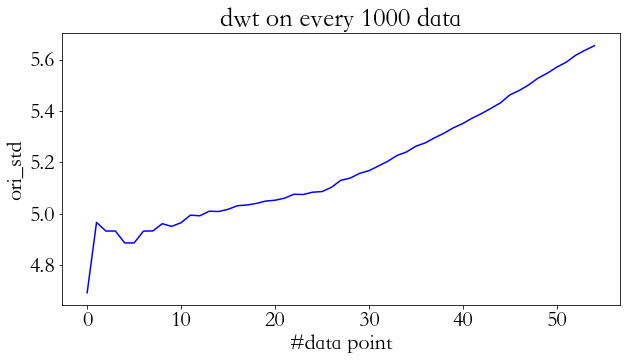

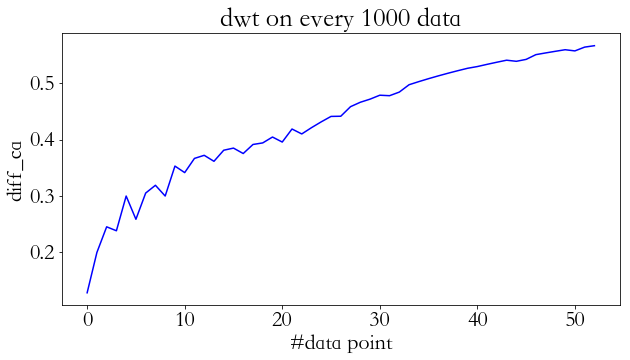

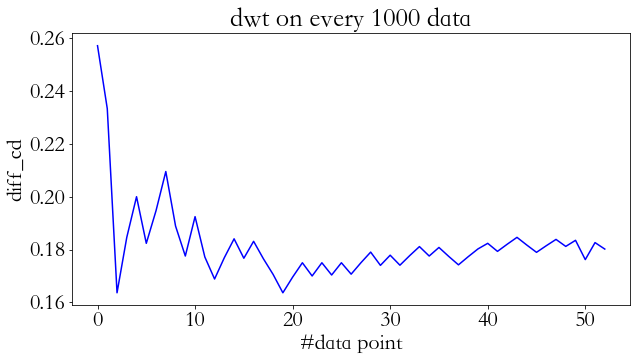

In [338]:
Check_AC(z12)

8


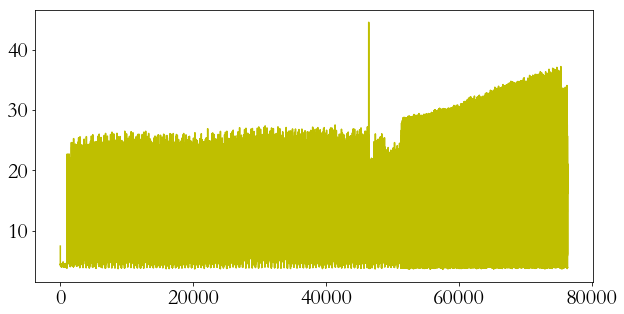

10 14
0.30000000000000004 0.15714285714285714
10 18
0.46666666666666673 0.15555555555555556
10 22
0.5272727272727273 0.15454545454545454
10 26
0.5692307692307692 0.16153846153846152
10 30
0.6000000000000001 0.16666666666666669
10 34
0.6235294117647059 0.18823529411764706
10 38
0.6421052631578947 0.17368421052631577
10 42
0.6571428571428573 0.1952380952380952
10 45
0.6666666666666667 0.19999999999999996
10 49
0.6775510204081633 0.19183673469387752
10 53
0.6867924528301887 0.18490566037735845
10 57
0.6771929824561405 0.21403508771929824
10 61
0.6852459016393443 0.2065573770491803
10 65
0.7076923076923077 0.19999999999999996
10 69
0.7130434782608697 0.208695652173913
10 73
0.7178082191780822 0.23013698630136986
10 77
0.7220779220779221 0.23636363636363633
10 81
0.725925925925926 0.21728395061728395
10 85
0.7294117647058824 0.23529411764705882
10 88
0.7318181818181819 0.23636363636363633
10 92
0.7347826086956523 0.23043478260869565
10 96
0.7375 0.22499999999999998
10 100
0.74 0.21999999999

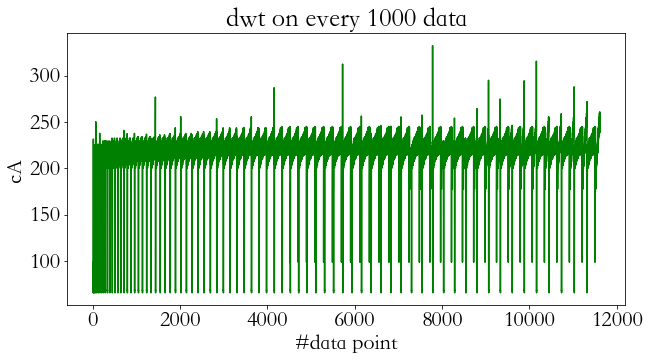

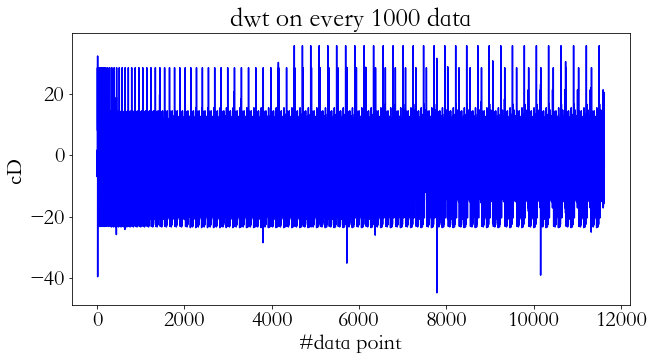

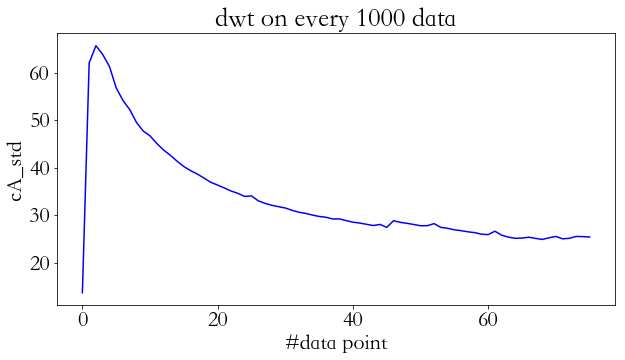

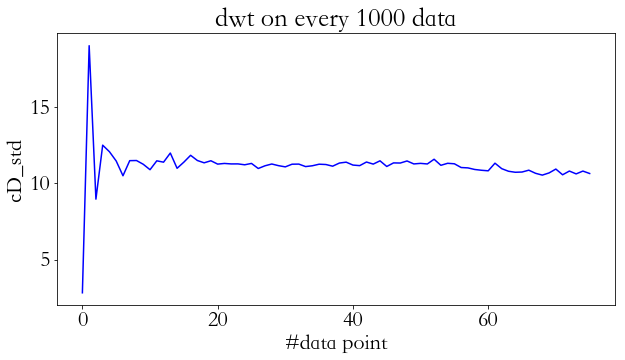

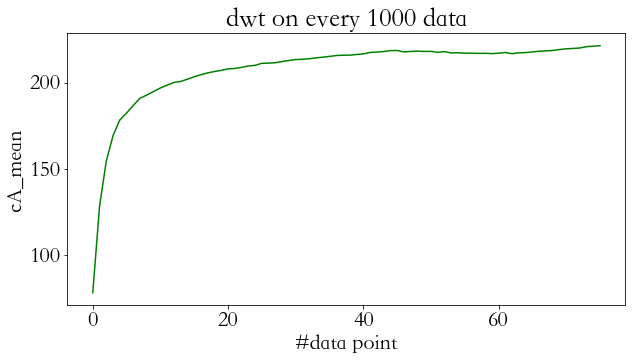

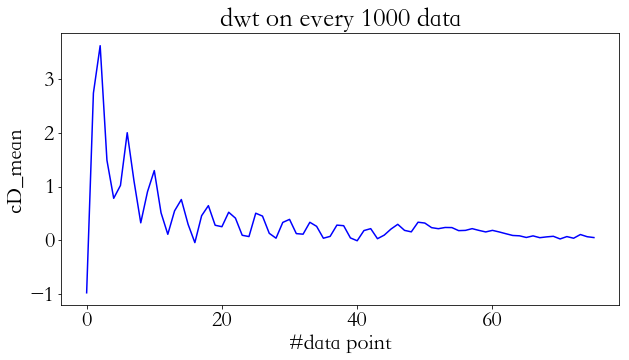

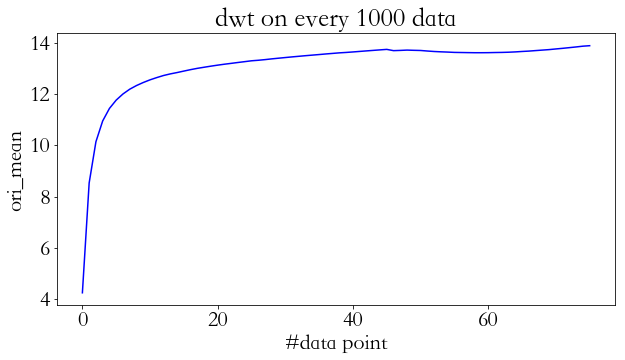

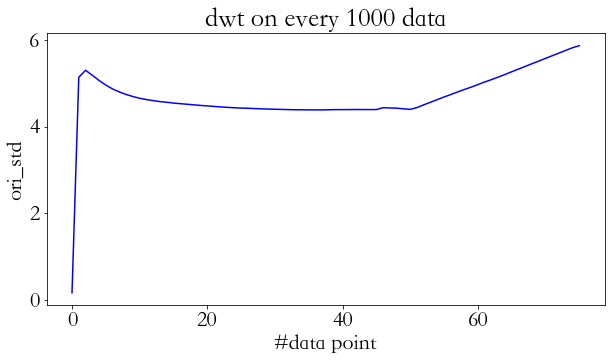

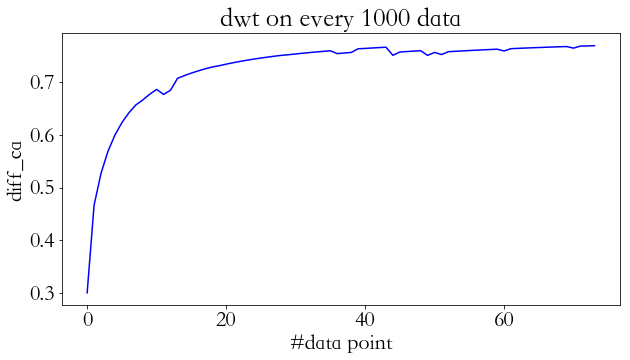

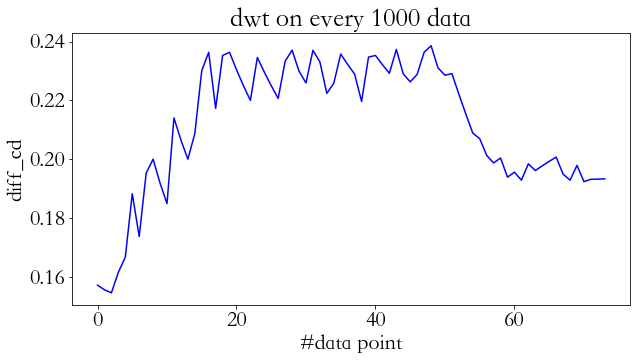

In [339]:
Check_AC(z11)

8


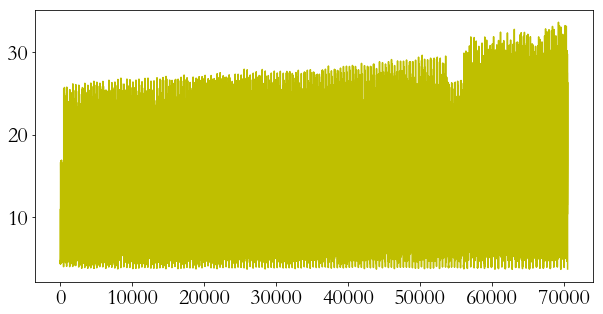

10 14
0.19999999999999996 0.09999999999999998
10 18
0.36666666666666664 0.18888888888888888
10 22
0.3818181818181818 0.18181818181818177
10 26
0.43076923076923074 0.14615384615384613
10 30
0.39999999999999997 0.16666666666666663
10 34
0.4352941176470588 0.1470588235294118
10 38
0.4631578947368421 0.1842105263157895
10 42
0.4904761904761905 0.2142857142857143
10 45
0.5333333333333334 0.21111111111111114
10 49
0.5551020408163265 0.19387755102040816
10 53
0.5735849056603775 0.19811320754716977
10 57
0.5719298245614035 0.2192982456140351
10 61
0.6032786885245902 0.23770491803278693
10 65
0.6153846153846154 0.20769230769230773
10 69
0.6260869565217392 0.2115942028985508
10 73
0.6397260273972603 0.23972602739726023
10 77
0.6402597402597403 0.2272727272727273
10 81
0.6530864197530865 0.22839506172839508
10 85
0.6647058823529413 0.21764705882352942
10 88
0.6840909090909091 0.23863636363636365
10 92
0.682608695652174 0.2282608695652174
10 96
0.7020833333333334 0.22916666666666663
10 100
0.71 0.

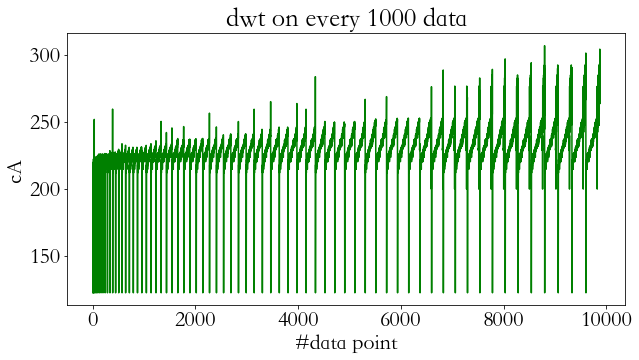

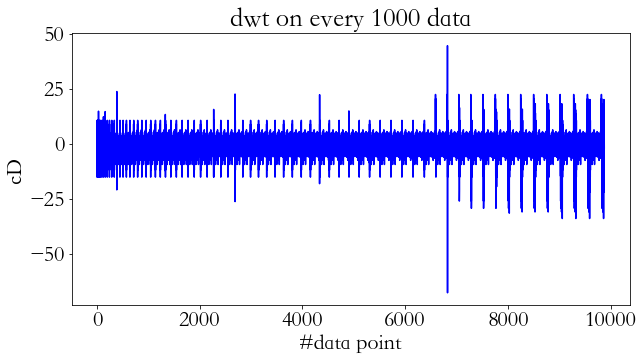

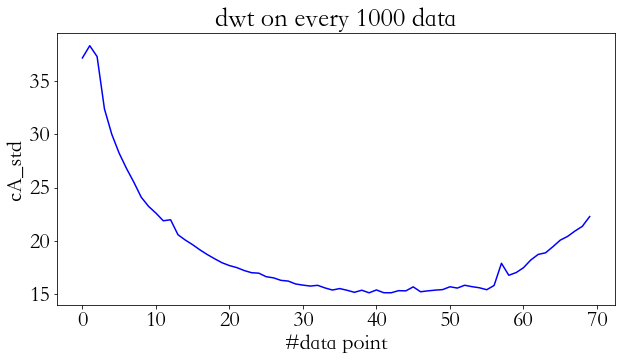

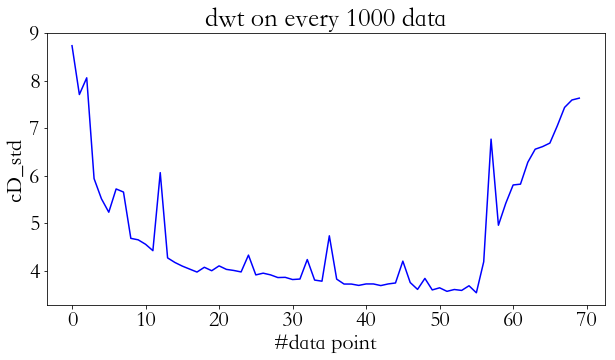

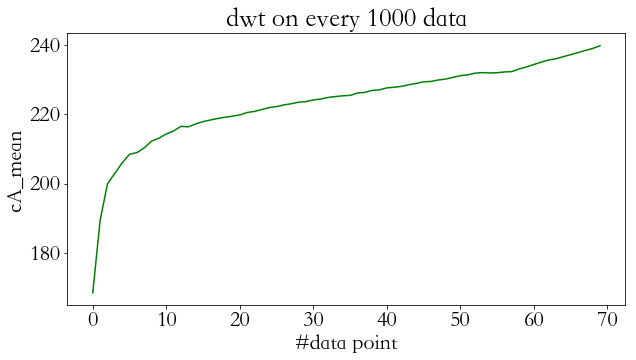

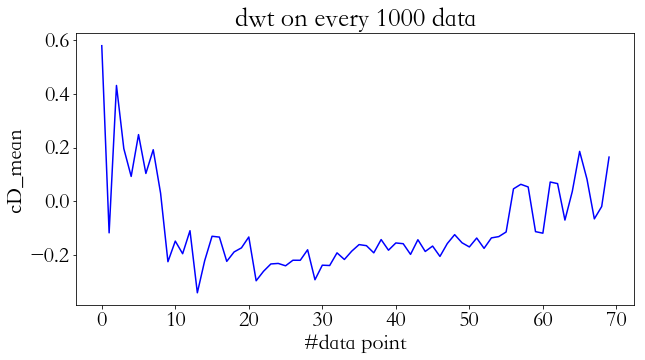

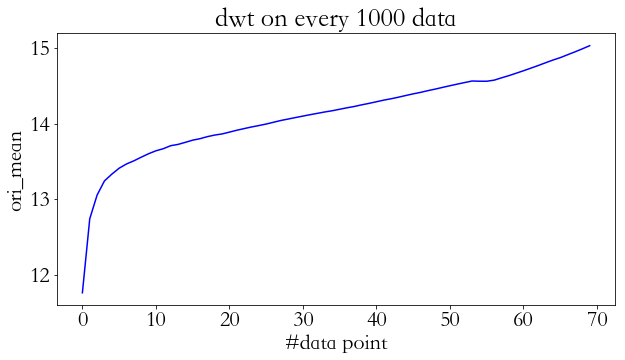

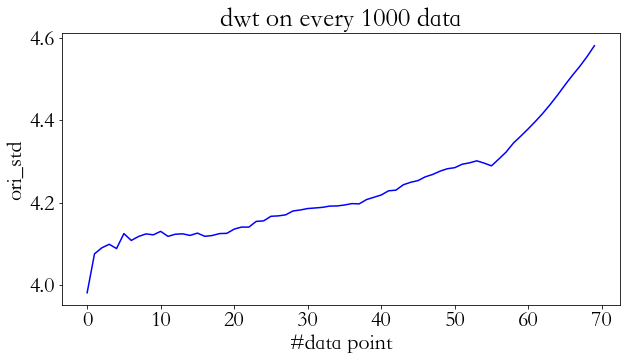

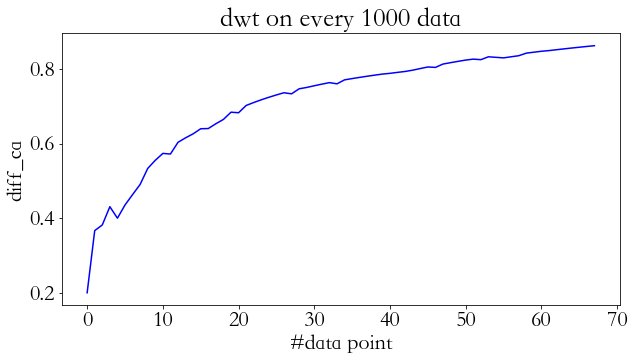

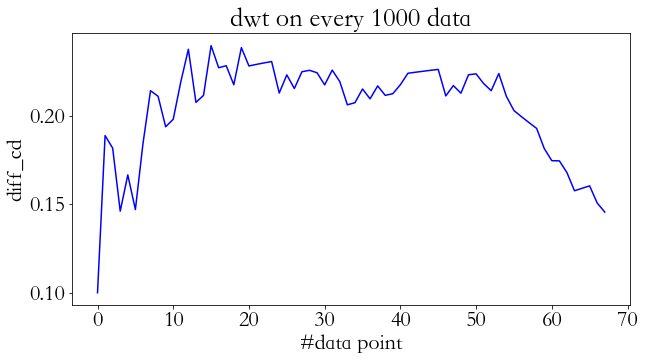

In [340]:
Check_AC(z10)

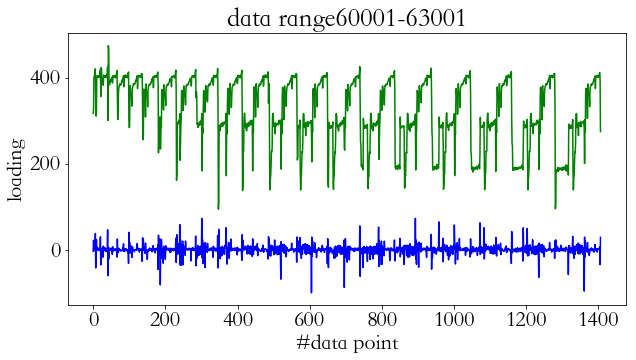

In [160]:
block_sz = 3000
total_sz = len(z15)
ca_list = []
cd_list = []


for i in range(1, total_sz-block_sz-1, block_sz):
    data = list(z15.iloc[-(i+block_sz):]['主軸負載'].values)
    coeff = pywt.wavedec(data,'db2',mode='sym', level=9)   # 按 level 层分解，使用pywt包进行计算， cAn是尺度系数 cDn为小波系数
    ca_list += list(coeff[0])
    cd_list += list(coeff[1])
    
    if False:
        plt.figure(figsize=(10,5))
        plt.plot(coeff[0])
        
        plt.ylabel('dwt')
        plt.xlabel('#data point')
        plt.title('data range'+str(i)+'-'+str(i+block_sz))
        plt.show()
    
plt.figure(figsize=(10,5))
plt.plot(ca_list, c='g')
plt.plot(cd_list, c='b')

plt.ylabel('loading')
plt.xlabel('#data point')
plt.title('data range'+str(i)+'-'+str(i+block_sz))
plt.show()




In [162]:
z15.dtypes

index           int64
time_begin     object
time_end       object
單節             object
主軸負載          float64
Z軸機械座標        float64
實際進給          float64
實際轉速          float64
設定進給          float64
設定轉速            int64
index0          int64
z_            float64
path          float64
layer         float64
進給率           float64
dtype: object

In [173]:
z15 = z15.astype({'z_':np.float32})

In [174]:
z15.dtypes

index           int64
time_begin     object
time_end       object
單節             object
主軸負載          float64
Z軸機械座標        float64
實際進給          float64
實際轉速          float64
設定進給          float64
設定轉速            int64
index0          int64
z_            float32
path          float64
layer         float64
進給率           float64
dtype: object

In [172]:
z15.memory_usage()

Index             80
index         507512
time_begin    507512
time_end      507512
單節            507512
主軸負載          507512
Z軸機械座標        507512
實際進給          507512
實際轉速          507512
設定進給          507512
設定轉速          507512
index0        507512
z_            507512
path          507512
layer         507512
進給率           507512
dtype: int64

In [176]:
z15.memory_usage(index=True)

Index             80
index         507512
time_begin    507512
time_end      507512
單節            507512
主軸負載          507512
Z軸機械座標        507512
實際進給          507512
實際轉速          507512
設定進給          507512
設定轉速          507512
index0        507512
z_            253756
path          507512
layer         507512
進給率           507512
dtype: int64

In [177]:
z15.memory_usage(index=True).sum()

7359004

In [2]:
import pandas as pd
z_df = pd.DataFrame({'A':[1,2,3], 'B':[2,3,4]})

In [5]:
z_df['A']

0    1
1    2
2    3
Name: A, dtype: int64